# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [25]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

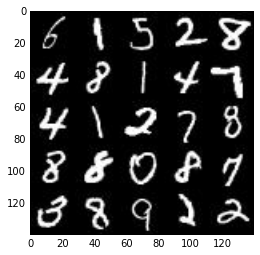

In [26]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

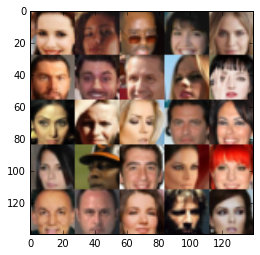

In [27]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [28]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.4.1
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [29]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_inputs = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels),
                                'real_inputs')
    z_inputs = tf.placeholder(tf.float32, (None, z_dim), 'z_inputs')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return real_inputs, z_inputs, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [30]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    alpha = 0.2
    x = images
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [31]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    training = is_train
    alpha = 0.1
    output_dim = out_channel_dim
    #reuse = False
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*64)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 64))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)

        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=1, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha * x2, x2)
        x2 = tf.nn.dropout(x2, keep_prob=0.5)
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha * x3, x3)
        x3 = tf.nn.dropout(x3, keep_prob=0.5)
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding='same')
        # 32x32x3 now
        out = tf.tanh(logits)
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [32]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
        logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
        logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [33]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    d_train_opt = tf.train.AdamOptimizer(
        learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    
    ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    g_updates = [opt for opt in ops if opt.name.startswith('generator')]
    with tf.control_dependencies(g_updates):
        g_train_opt = tf.train.AdamOptimizer(
            learning_rate, beta1).minimize(g_loss, var_list=g_vars)
        
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [34]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [35]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    _, img_width, img_height, img_channels = data_shape
    
    real_input, z_input, lr = model_inputs(
        img_width, img_height, img_channels, z_dim)
    
    d_loss, g_loss = model_loss(real_input, z_input, img_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    print_every = 10
    show_every = 100
    losses = []
    n_images = 25
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images = batch_images * 2.0 
                z_sample = np.random.uniform(-1, 1, (batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={
                        real_input: batch_images, z_input: z_sample, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={
                        z_input: z_sample, lr: learning_rate})
                
                if steps % print_every == 0:
                    train_loss_d = d_loss.eval({z_input: z_sample, real_input: batch_images})
                    train_loss_g = g_loss.eval({z_input: z_sample})
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    losses.append((train_loss_d, train_loss_g))
                
                if steps % show_every == 0:
                    show_generator_output(sess, n_images, z_input, img_channels, data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.1573... Generator Loss: 2.7447
Epoch 1/2... Discriminator Loss: 0.1710... Generator Loss: 2.4699
Epoch 1/2... Discriminator Loss: 0.2092... Generator Loss: 2.4049
Epoch 1/2... Discriminator Loss: 1.1539... Generator Loss: 0.3947
Epoch 1/2... Discriminator Loss: 1.2311... Generator Loss: 6.3659
Epoch 1/2... Discriminator Loss: 0.1515... Generator Loss: 2.6591
Epoch 1/2... Discriminator Loss: 0.1237... Generator Loss: 3.9416
Epoch 1/2... Discriminator Loss: 0.1046... Generator Loss: 3.3126
Epoch 1/2... Discriminator Loss: 0.0869... Generator Loss: 3.1466
Epoch 1/2... Discriminator Loss: 0.0784... Generator Loss: 3.4085


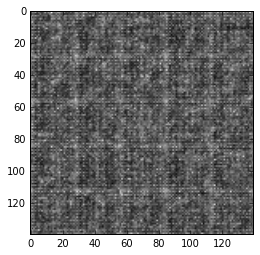

Epoch 1/2... Discriminator Loss: 0.0521... Generator Loss: 3.9577
Epoch 1/2... Discriminator Loss: 0.0540... Generator Loss: 4.1182
Epoch 1/2... Discriminator Loss: 0.0934... Generator Loss: 4.3800
Epoch 1/2... Discriminator Loss: 0.5017... Generator Loss: 1.9248
Epoch 1/2... Discriminator Loss: 0.3248... Generator Loss: 2.7733
Epoch 1/2... Discriminator Loss: 0.1636... Generator Loss: 3.1720
Epoch 1/2... Discriminator Loss: 0.3043... Generator Loss: 3.7433
Epoch 1/2... Discriminator Loss: 0.1786... Generator Loss: 2.3913
Epoch 1/2... Discriminator Loss: 1.5232... Generator Loss: 0.5384
Epoch 1/2... Discriminator Loss: 0.2033... Generator Loss: 2.8213


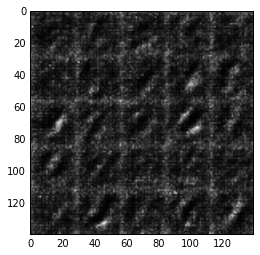

Epoch 1/2... Discriminator Loss: 0.2103... Generator Loss: 2.4366
Epoch 1/2... Discriminator Loss: 0.2059... Generator Loss: 2.4107
Epoch 1/2... Discriminator Loss: 0.3373... Generator Loss: 1.7888
Epoch 1/2... Discriminator Loss: 0.2320... Generator Loss: 2.3327
Epoch 1/2... Discriminator Loss: 0.6308... Generator Loss: 4.2293
Epoch 1/2... Discriminator Loss: 1.0535... Generator Loss: 4.3718
Epoch 1/2... Discriminator Loss: 0.3015... Generator Loss: 1.3963
Epoch 1/2... Discriminator Loss: 0.2124... Generator Loss: 2.4454
Epoch 1/2... Discriminator Loss: 0.4736... Generator Loss: 4.3589
Epoch 1/2... Discriminator Loss: 0.2191... Generator Loss: 2.1971


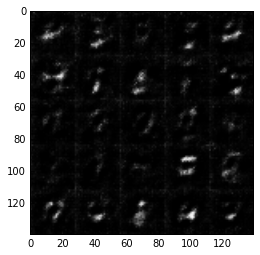

Epoch 1/2... Discriminator Loss: 1.2652... Generator Loss: 0.5738
Epoch 1/2... Discriminator Loss: 0.6251... Generator Loss: 4.0916
Epoch 1/2... Discriminator Loss: 0.4407... Generator Loss: 2.6395
Epoch 1/2... Discriminator Loss: 0.4138... Generator Loss: 3.1238
Epoch 1/2... Discriminator Loss: 1.2936... Generator Loss: 4.3913
Epoch 1/2... Discriminator Loss: 0.4274... Generator Loss: 2.1789
Epoch 1/2... Discriminator Loss: 0.3204... Generator Loss: 2.6174
Epoch 1/2... Discriminator Loss: 0.6433... Generator Loss: 1.0814
Epoch 1/2... Discriminator Loss: 0.3291... Generator Loss: 2.1511
Epoch 1/2... Discriminator Loss: 0.3493... Generator Loss: 2.9744


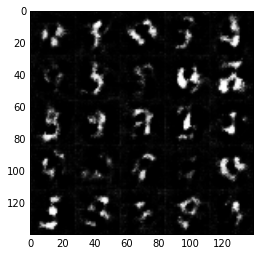

Epoch 1/2... Discriminator Loss: 2.1297... Generator Loss: 0.2175
Epoch 1/2... Discriminator Loss: 0.2945... Generator Loss: 1.7849
Epoch 1/2... Discriminator Loss: 0.3026... Generator Loss: 2.0517
Epoch 1/2... Discriminator Loss: 0.6663... Generator Loss: 1.1262
Epoch 1/2... Discriminator Loss: 0.3569... Generator Loss: 1.7123
Epoch 1/2... Discriminator Loss: 0.5334... Generator Loss: 3.7658
Epoch 1/2... Discriminator Loss: 0.2798... Generator Loss: 1.9352
Epoch 1/2... Discriminator Loss: 0.2382... Generator Loss: 2.7083
Epoch 1/2... Discriminator Loss: 0.5062... Generator Loss: 1.4778
Epoch 1/2... Discriminator Loss: 0.3229... Generator Loss: 3.0124


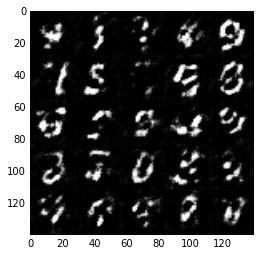

Epoch 1/2... Discriminator Loss: 1.3666... Generator Loss: 6.3657
Epoch 1/2... Discriminator Loss: 0.3808... Generator Loss: 1.7080
Epoch 1/2... Discriminator Loss: 0.2777... Generator Loss: 1.9141
Epoch 1/2... Discriminator Loss: 0.3094... Generator Loss: 1.7829
Epoch 1/2... Discriminator Loss: 0.3419... Generator Loss: 3.8437
Epoch 1/2... Discriminator Loss: 0.2321... Generator Loss: 2.8070
Epoch 1/2... Discriminator Loss: 0.5543... Generator Loss: 1.3248
Epoch 1/2... Discriminator Loss: 0.2238... Generator Loss: 2.3083
Epoch 1/2... Discriminator Loss: 0.2593... Generator Loss: 2.4357
Epoch 1/2... Discriminator Loss: 0.7733... Generator Loss: 0.9225


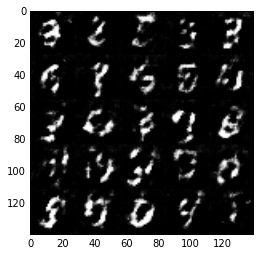

Epoch 1/2... Discriminator Loss: 0.2438... Generator Loss: 2.3253
Epoch 1/2... Discriminator Loss: 0.7753... Generator Loss: 0.9631
Epoch 1/2... Discriminator Loss: 0.2078... Generator Loss: 4.0226
Epoch 1/2... Discriminator Loss: 0.3257... Generator Loss: 1.8692
Epoch 1/2... Discriminator Loss: 0.6851... Generator Loss: 3.7092
Epoch 1/2... Discriminator Loss: 0.5076... Generator Loss: 1.0123
Epoch 1/2... Discriminator Loss: 0.3287... Generator Loss: 2.0109
Epoch 1/2... Discriminator Loss: 0.3863... Generator Loss: 3.8508
Epoch 1/2... Discriminator Loss: 0.2837... Generator Loss: 2.0608
Epoch 1/2... Discriminator Loss: 0.2232... Generator Loss: 2.0538


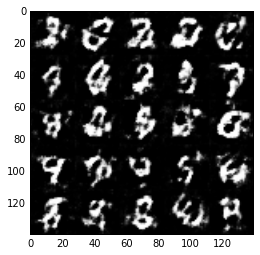

Epoch 1/2... Discriminator Loss: 0.3901... Generator Loss: 1.6782
Epoch 1/2... Discriminator Loss: 0.4220... Generator Loss: 3.8691
Epoch 1/2... Discriminator Loss: 0.2777... Generator Loss: 2.1227
Epoch 1/2... Discriminator Loss: 0.2192... Generator Loss: 2.4823
Epoch 1/2... Discriminator Loss: 0.3020... Generator Loss: 1.9769
Epoch 1/2... Discriminator Loss: 1.4621... Generator Loss: 0.4651
Epoch 1/2... Discriminator Loss: 0.2316... Generator Loss: 3.0651
Epoch 1/2... Discriminator Loss: 0.1865... Generator Loss: 2.9376
Epoch 1/2... Discriminator Loss: 0.3308... Generator Loss: 1.6588
Epoch 1/2... Discriminator Loss: 0.4114... Generator Loss: 1.7075


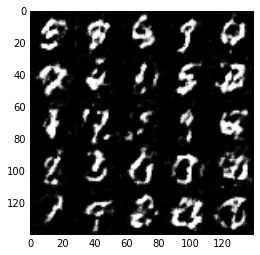

Epoch 1/2... Discriminator Loss: 0.6364... Generator Loss: 1.0551
Epoch 1/2... Discriminator Loss: 1.6569... Generator Loss: 5.6102
Epoch 1/2... Discriminator Loss: 0.2899... Generator Loss: 1.4799
Epoch 1/2... Discriminator Loss: 0.2294... Generator Loss: 1.9885
Epoch 1/2... Discriminator Loss: 0.4138... Generator Loss: 3.5962
Epoch 1/2... Discriminator Loss: 0.4371... Generator Loss: 1.7112
Epoch 1/2... Discriminator Loss: 0.3326... Generator Loss: 1.8244
Epoch 1/2... Discriminator Loss: 0.7846... Generator Loss: 1.0001
Epoch 1/2... Discriminator Loss: 0.2277... Generator Loss: 2.5243
Epoch 1/2... Discriminator Loss: 0.4885... Generator Loss: 1.1566


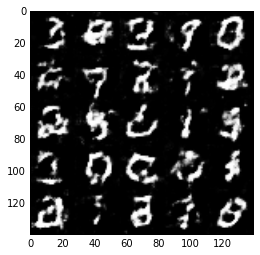

Epoch 1/2... Discriminator Loss: 0.7565... Generator Loss: 5.1239
Epoch 1/2... Discriminator Loss: 0.4741... Generator Loss: 1.5872
Epoch 1/2... Discriminator Loss: 0.2650... Generator Loss: 2.1082
Epoch 1/2... Discriminator Loss: 0.1862... Generator Loss: 2.6667
Epoch 1/2... Discriminator Loss: 0.2520... Generator Loss: 2.0604
Epoch 1/2... Discriminator Loss: 0.2727... Generator Loss: 2.2093
Epoch 1/2... Discriminator Loss: 0.2016... Generator Loss: 2.7682
Epoch 1/2... Discriminator Loss: 0.2851... Generator Loss: 2.0119
Epoch 1/2... Discriminator Loss: 1.1590... Generator Loss: 0.6424
Epoch 1/2... Discriminator Loss: 0.8228... Generator Loss: 3.6778


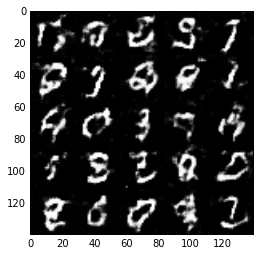

Epoch 1/2... Discriminator Loss: 0.2877... Generator Loss: 2.0953
Epoch 1/2... Discriminator Loss: 0.2118... Generator Loss: 2.2426
Epoch 1/2... Discriminator Loss: 0.3714... Generator Loss: 1.8439
Epoch 1/2... Discriminator Loss: 0.1904... Generator Loss: 2.6536
Epoch 1/2... Discriminator Loss: 0.4091... Generator Loss: 2.1669
Epoch 1/2... Discriminator Loss: 0.2480... Generator Loss: 2.9617
Epoch 1/2... Discriminator Loss: 0.4344... Generator Loss: 2.1226
Epoch 1/2... Discriminator Loss: 0.2993... Generator Loss: 2.6468
Epoch 1/2... Discriminator Loss: 0.3370... Generator Loss: 1.5439
Epoch 1/2... Discriminator Loss: 0.1998... Generator Loss: 2.4886


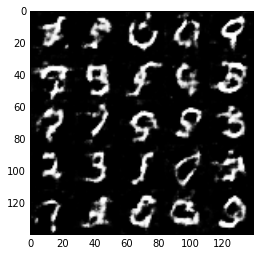

Epoch 1/2... Discriminator Loss: 0.3602... Generator Loss: 3.9939
Epoch 1/2... Discriminator Loss: 0.4169... Generator Loss: 4.5874
Epoch 1/2... Discriminator Loss: 0.6020... Generator Loss: 1.2853
Epoch 1/2... Discriminator Loss: 0.3563... Generator Loss: 1.7525
Epoch 1/2... Discriminator Loss: 0.4188... Generator Loss: 1.4884
Epoch 1/2... Discriminator Loss: 0.4338... Generator Loss: 1.8875
Epoch 1/2... Discriminator Loss: 0.2562... Generator Loss: 2.7812
Epoch 1/2... Discriminator Loss: 0.3297... Generator Loss: 3.1072
Epoch 1/2... Discriminator Loss: 0.4380... Generator Loss: 1.2310
Epoch 1/2... Discriminator Loss: 0.2155... Generator Loss: 2.5286


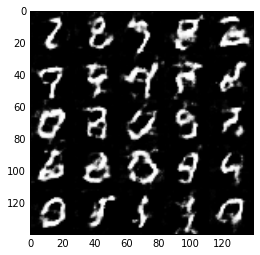

Epoch 1/2... Discriminator Loss: 0.6511... Generator Loss: 1.2432
Epoch 1/2... Discriminator Loss: 0.3192... Generator Loss: 1.6027
Epoch 1/2... Discriminator Loss: 0.7042... Generator Loss: 1.1783
Epoch 1/2... Discriminator Loss: 0.3900... Generator Loss: 3.2336
Epoch 1/2... Discriminator Loss: 0.2606... Generator Loss: 3.5000
Epoch 1/2... Discriminator Loss: 0.8533... Generator Loss: 5.1441
Epoch 1/2... Discriminator Loss: 1.0156... Generator Loss: 0.6593
Epoch 1/2... Discriminator Loss: 1.8646... Generator Loss: 5.4465
Epoch 1/2... Discriminator Loss: 0.2985... Generator Loss: 2.7345
Epoch 1/2... Discriminator Loss: 0.5795... Generator Loss: 1.3134


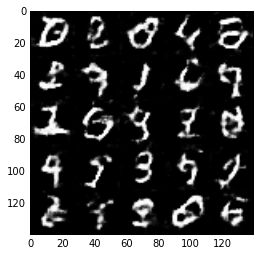

Epoch 1/2... Discriminator Loss: 0.7647... Generator Loss: 0.9349
Epoch 1/2... Discriminator Loss: 0.2530... Generator Loss: 2.1142
Epoch 1/2... Discriminator Loss: 0.3097... Generator Loss: 1.8240
Epoch 1/2... Discriminator Loss: 0.2970... Generator Loss: 2.9170
Epoch 1/2... Discriminator Loss: 0.3231... Generator Loss: 2.5336
Epoch 1/2... Discriminator Loss: 0.2982... Generator Loss: 3.4439
Epoch 1/2... Discriminator Loss: 0.3681... Generator Loss: 1.6975
Epoch 1/2... Discriminator Loss: 0.4979... Generator Loss: 1.3149
Epoch 1/2... Discriminator Loss: 0.3065... Generator Loss: 2.9311
Epoch 1/2... Discriminator Loss: 0.3014... Generator Loss: 2.0141


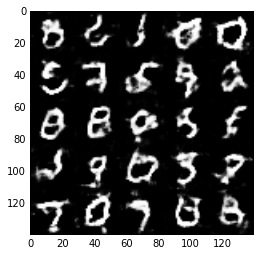

Epoch 1/2... Discriminator Loss: 0.2336... Generator Loss: 3.0976
Epoch 1/2... Discriminator Loss: 0.3536... Generator Loss: 2.8434
Epoch 1/2... Discriminator Loss: 0.2712... Generator Loss: 1.9128
Epoch 1/2... Discriminator Loss: 0.3803... Generator Loss: 1.7199
Epoch 1/2... Discriminator Loss: 0.6390... Generator Loss: 0.9396
Epoch 1/2... Discriminator Loss: 0.3659... Generator Loss: 1.8059
Epoch 1/2... Discriminator Loss: 0.3406... Generator Loss: 2.0641
Epoch 1/2... Discriminator Loss: 0.2704... Generator Loss: 3.1832
Epoch 1/2... Discriminator Loss: 0.4093... Generator Loss: 3.1486
Epoch 1/2... Discriminator Loss: 0.3034... Generator Loss: 2.9320


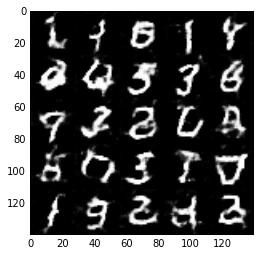

Epoch 1/2... Discriminator Loss: 1.1789... Generator Loss: 4.7141
Epoch 1/2... Discriminator Loss: 0.4225... Generator Loss: 1.4233
Epoch 1/2... Discriminator Loss: 0.4171... Generator Loss: 1.5446
Epoch 1/2... Discriminator Loss: 0.2542... Generator Loss: 2.3680
Epoch 1/2... Discriminator Loss: 0.3004... Generator Loss: 1.7664
Epoch 1/2... Discriminator Loss: 0.2603... Generator Loss: 2.3938
Epoch 1/2... Discriminator Loss: 0.2425... Generator Loss: 1.9473
Epoch 1/2... Discriminator Loss: 0.5172... Generator Loss: 1.3191
Epoch 1/2... Discriminator Loss: 0.2168... Generator Loss: 2.5042
Epoch 1/2... Discriminator Loss: 0.6601... Generator Loss: 1.3734


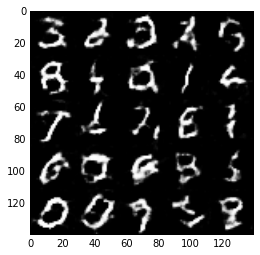

Epoch 1/2... Discriminator Loss: 0.2409... Generator Loss: 2.3849
Epoch 1/2... Discriminator Loss: 0.3639... Generator Loss: 1.9847
Epoch 1/2... Discriminator Loss: 0.7630... Generator Loss: 4.5750
Epoch 1/2... Discriminator Loss: 0.2123... Generator Loss: 3.2029
Epoch 1/2... Discriminator Loss: 0.3651... Generator Loss: 1.8427
Epoch 1/2... Discriminator Loss: 0.3511... Generator Loss: 2.7227
Epoch 1/2... Discriminator Loss: 0.2932... Generator Loss: 2.5138
Epoch 1/2... Discriminator Loss: 0.3260... Generator Loss: 1.6218
Epoch 1/2... Discriminator Loss: 0.2738... Generator Loss: 3.3966
Epoch 1/2... Discriminator Loss: 0.5969... Generator Loss: 3.7772


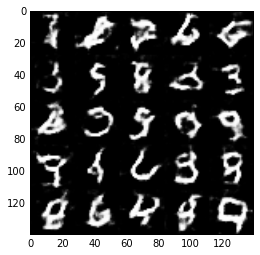

Epoch 1/2... Discriminator Loss: 0.2947... Generator Loss: 2.8872
Epoch 1/2... Discriminator Loss: 0.2892... Generator Loss: 2.2967
Epoch 1/2... Discriminator Loss: 0.3043... Generator Loss: 2.2585
Epoch 1/2... Discriminator Loss: 0.3178... Generator Loss: 3.1975
Epoch 1/2... Discriminator Loss: 0.2154... Generator Loss: 2.4927
Epoch 1/2... Discriminator Loss: 0.4305... Generator Loss: 3.4633
Epoch 1/2... Discriminator Loss: 0.2982... Generator Loss: 2.3575
Epoch 1/2... Discriminator Loss: 0.1688... Generator Loss: 3.1365
Epoch 1/2... Discriminator Loss: 0.2979... Generator Loss: 2.2991
Epoch 1/2... Discriminator Loss: 0.3969... Generator Loss: 1.7506


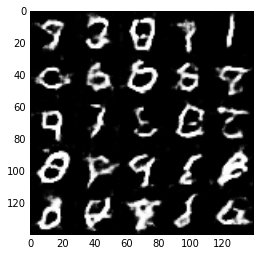

Epoch 1/2... Discriminator Loss: 0.5412... Generator Loss: 0.9703
Epoch 1/2... Discriminator Loss: 0.4257... Generator Loss: 2.1120
Epoch 1/2... Discriminator Loss: 0.3047... Generator Loss: 2.1183
Epoch 1/2... Discriminator Loss: 0.5488... Generator Loss: 4.5108
Epoch 1/2... Discriminator Loss: 0.6992... Generator Loss: 4.2286
Epoch 1/2... Discriminator Loss: 0.3464... Generator Loss: 2.3640
Epoch 1/2... Discriminator Loss: 0.3288... Generator Loss: 1.9018
Epoch 2/2... Discriminator Loss: 0.3611... Generator Loss: 1.5067
Epoch 2/2... Discriminator Loss: 0.2386... Generator Loss: 2.1361
Epoch 2/2... Discriminator Loss: 0.2145... Generator Loss: 2.9651


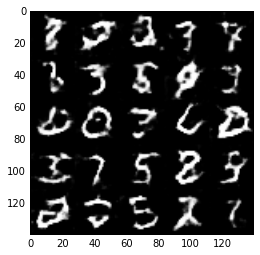

Epoch 2/2... Discriminator Loss: 0.3171... Generator Loss: 1.4229
Epoch 2/2... Discriminator Loss: 1.2624... Generator Loss: 0.6871
Epoch 2/2... Discriminator Loss: 0.3680... Generator Loss: 1.7552
Epoch 2/2... Discriminator Loss: 0.2049... Generator Loss: 2.3185
Epoch 2/2... Discriminator Loss: 0.2296... Generator Loss: 2.4780
Epoch 2/2... Discriminator Loss: 0.2314... Generator Loss: 2.5086
Epoch 2/2... Discriminator Loss: 0.1838... Generator Loss: 2.4900
Epoch 2/2... Discriminator Loss: 0.1778... Generator Loss: 2.7718
Epoch 2/2... Discriminator Loss: 0.2207... Generator Loss: 2.4701
Epoch 2/2... Discriminator Loss: 0.2554... Generator Loss: 2.0503


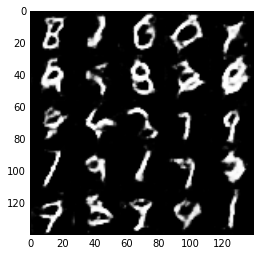

Epoch 2/2... Discriminator Loss: 0.3459... Generator Loss: 1.5251
Epoch 2/2... Discriminator Loss: 0.3087... Generator Loss: 1.8964
Epoch 2/2... Discriminator Loss: 0.3436... Generator Loss: 1.4771
Epoch 2/2... Discriminator Loss: 0.3836... Generator Loss: 3.6662
Epoch 2/2... Discriminator Loss: 0.2093... Generator Loss: 2.6303
Epoch 2/2... Discriminator Loss: 0.2103... Generator Loss: 2.4415
Epoch 2/2... Discriminator Loss: 0.1824... Generator Loss: 3.1225
Epoch 2/2... Discriminator Loss: 0.2778... Generator Loss: 2.7869
Epoch 2/2... Discriminator Loss: 0.3023... Generator Loss: 2.2512
Epoch 2/2... Discriminator Loss: 0.3200... Generator Loss: 1.5923


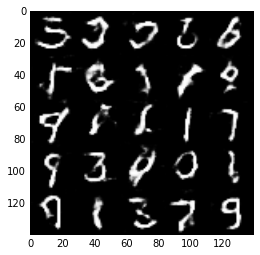

Epoch 2/2... Discriminator Loss: 0.1362... Generator Loss: 2.8168
Epoch 2/2... Discriminator Loss: 0.1425... Generator Loss: 3.6610
Epoch 2/2... Discriminator Loss: 1.3878... Generator Loss: 5.5510
Epoch 2/2... Discriminator Loss: 0.2972... Generator Loss: 2.0777
Epoch 2/2... Discriminator Loss: 0.2575... Generator Loss: 1.8057
Epoch 2/2... Discriminator Loss: 0.2249... Generator Loss: 2.2351
Epoch 2/2... Discriminator Loss: 1.3124... Generator Loss: 0.4754
Epoch 2/2... Discriminator Loss: 0.2457... Generator Loss: 2.4776
Epoch 2/2... Discriminator Loss: 0.1518... Generator Loss: 2.7529
Epoch 2/2... Discriminator Loss: 0.2432... Generator Loss: 3.4117


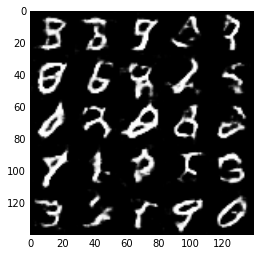

Epoch 2/2... Discriminator Loss: 0.1825... Generator Loss: 3.1290
Epoch 2/2... Discriminator Loss: 0.1551... Generator Loss: 2.8450
Epoch 2/2... Discriminator Loss: 0.2004... Generator Loss: 3.8885
Epoch 2/2... Discriminator Loss: 0.2623... Generator Loss: 2.2791
Epoch 2/2... Discriminator Loss: 0.2838... Generator Loss: 1.8288
Epoch 2/2... Discriminator Loss: 0.2345... Generator Loss: 2.4477
Epoch 2/2... Discriminator Loss: 0.1453... Generator Loss: 3.9839
Epoch 2/2... Discriminator Loss: 0.2107... Generator Loss: 2.3818
Epoch 2/2... Discriminator Loss: 0.1764... Generator Loss: 2.5608
Epoch 2/2... Discriminator Loss: 0.0843... Generator Loss: 3.3942


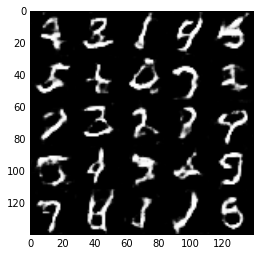

Epoch 2/2... Discriminator Loss: 0.2033... Generator Loss: 3.3486
Epoch 2/2... Discriminator Loss: 0.2339... Generator Loss: 1.7917
Epoch 2/2... Discriminator Loss: 0.3766... Generator Loss: 1.7364
Epoch 2/2... Discriminator Loss: 0.1554... Generator Loss: 2.0872
Epoch 2/2... Discriminator Loss: 0.2905... Generator Loss: 2.1496
Epoch 2/2... Discriminator Loss: 0.2290... Generator Loss: 2.5060
Epoch 2/2... Discriminator Loss: 0.2731... Generator Loss: 2.5194
Epoch 2/2... Discriminator Loss: 0.1508... Generator Loss: 2.4581
Epoch 2/2... Discriminator Loss: 0.1701... Generator Loss: 2.3137
Epoch 2/2... Discriminator Loss: 0.2642... Generator Loss: 4.0523


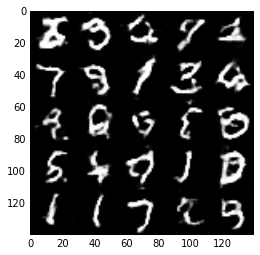

Epoch 2/2... Discriminator Loss: 0.3610... Generator Loss: 2.0621
Epoch 2/2... Discriminator Loss: 0.1101... Generator Loss: 2.9738
Epoch 2/2... Discriminator Loss: 0.1723... Generator Loss: 3.0223
Epoch 2/2... Discriminator Loss: 0.7335... Generator Loss: 1.3749
Epoch 2/2... Discriminator Loss: 0.5128... Generator Loss: 1.2923
Epoch 2/2... Discriminator Loss: 0.2631... Generator Loss: 2.2326
Epoch 2/2... Discriminator Loss: 0.2271... Generator Loss: 1.8647
Epoch 2/2... Discriminator Loss: 0.2502... Generator Loss: 2.4540
Epoch 2/2... Discriminator Loss: 0.1585... Generator Loss: 2.4509
Epoch 2/2... Discriminator Loss: 0.1432... Generator Loss: 2.3889


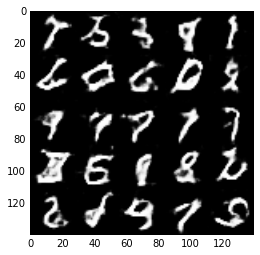

Epoch 2/2... Discriminator Loss: 0.1636... Generator Loss: 2.2025
Epoch 2/2... Discriminator Loss: 0.1470... Generator Loss: 3.3701
Epoch 2/2... Discriminator Loss: 0.1781... Generator Loss: 2.5976
Epoch 2/2... Discriminator Loss: 0.1508... Generator Loss: 3.4526
Epoch 2/2... Discriminator Loss: 0.2918... Generator Loss: 4.5814
Epoch 2/2... Discriminator Loss: 0.1099... Generator Loss: 3.3074
Epoch 2/2... Discriminator Loss: 0.1573... Generator Loss: 2.7690
Epoch 2/2... Discriminator Loss: 0.1893... Generator Loss: 1.8421
Epoch 2/2... Discriminator Loss: 0.1632... Generator Loss: 2.3425
Epoch 2/2... Discriminator Loss: 0.0805... Generator Loss: 3.6641


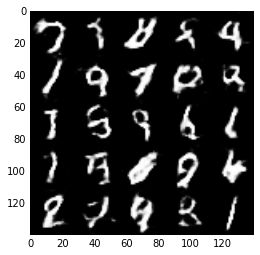

Epoch 2/2... Discriminator Loss: 0.0785... Generator Loss: 2.8075
Epoch 2/2... Discriminator Loss: 0.1325... Generator Loss: 3.6737
Epoch 2/2... Discriminator Loss: 0.1600... Generator Loss: 3.6788
Epoch 2/2... Discriminator Loss: 0.3145... Generator Loss: 2.0547
Epoch 2/2... Discriminator Loss: 0.4187... Generator Loss: 4.7297
Epoch 2/2... Discriminator Loss: 1.5685... Generator Loss: 0.2693
Epoch 2/2... Discriminator Loss: 0.3832... Generator Loss: 1.8509
Epoch 2/2... Discriminator Loss: 1.0835... Generator Loss: 0.5776
Epoch 2/2... Discriminator Loss: 0.2402... Generator Loss: 3.2145
Epoch 2/2... Discriminator Loss: 0.1648... Generator Loss: 3.1182


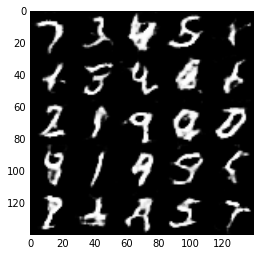

Epoch 2/2... Discriminator Loss: 0.1935... Generator Loss: 2.2121
Epoch 2/2... Discriminator Loss: 0.1268... Generator Loss: 2.6780
Epoch 2/2... Discriminator Loss: 0.3700... Generator Loss: 2.1418
Epoch 2/2... Discriminator Loss: 0.1755... Generator Loss: 2.2273
Epoch 2/2... Discriminator Loss: 0.1459... Generator Loss: 2.9802
Epoch 2/2... Discriminator Loss: 0.1633... Generator Loss: 3.3699
Epoch 2/2... Discriminator Loss: 0.1655... Generator Loss: 4.6491
Epoch 2/2... Discriminator Loss: 0.1470... Generator Loss: 2.9004
Epoch 2/2... Discriminator Loss: 0.1800... Generator Loss: 2.2359
Epoch 2/2... Discriminator Loss: 0.0664... Generator Loss: 3.3711


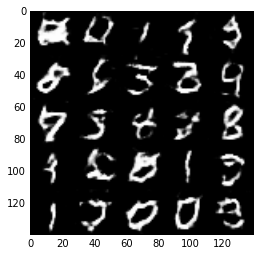

Epoch 2/2... Discriminator Loss: 0.2208... Generator Loss: 2.5473
Epoch 2/2... Discriminator Loss: 0.2414... Generator Loss: 4.1540
Epoch 2/2... Discriminator Loss: 0.1458... Generator Loss: 2.8251
Epoch 2/2... Discriminator Loss: 0.1106... Generator Loss: 2.1442
Epoch 2/2... Discriminator Loss: 0.0787... Generator Loss: 3.1558
Epoch 2/2... Discriminator Loss: 0.1855... Generator Loss: 2.5289
Epoch 2/2... Discriminator Loss: 0.0875... Generator Loss: 2.7789
Epoch 2/2... Discriminator Loss: 0.9696... Generator Loss: 5.0733
Epoch 2/2... Discriminator Loss: 0.9164... Generator Loss: 1.0053
Epoch 2/2... Discriminator Loss: 1.3082... Generator Loss: 0.6179


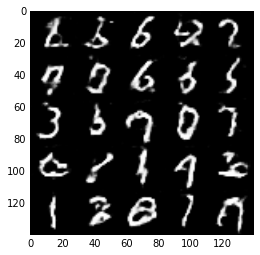

Epoch 2/2... Discriminator Loss: 0.1912... Generator Loss: 2.7227
Epoch 2/2... Discriminator Loss: 0.1740... Generator Loss: 2.8009
Epoch 2/2... Discriminator Loss: 0.1582... Generator Loss: 2.5447
Epoch 2/2... Discriminator Loss: 0.1593... Generator Loss: 2.8110
Epoch 2/2... Discriminator Loss: 0.1042... Generator Loss: 2.9316
Epoch 2/2... Discriminator Loss: 0.1367... Generator Loss: 2.8790
Epoch 2/2... Discriminator Loss: 0.1022... Generator Loss: 2.9217
Epoch 2/2... Discriminator Loss: 0.1880... Generator Loss: 2.7208
Epoch 2/2... Discriminator Loss: 0.1430... Generator Loss: 2.8106
Epoch 2/2... Discriminator Loss: 0.0687... Generator Loss: 3.5508


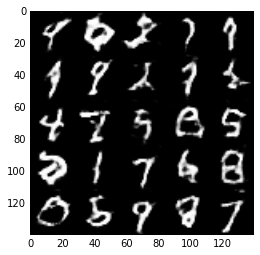

Epoch 2/2... Discriminator Loss: 0.1410... Generator Loss: 2.4677
Epoch 2/2... Discriminator Loss: 0.1110... Generator Loss: 3.0284
Epoch 2/2... Discriminator Loss: 0.1402... Generator Loss: 3.6056
Epoch 2/2... Discriminator Loss: 0.2732... Generator Loss: 1.8596
Epoch 2/2... Discriminator Loss: 0.2922... Generator Loss: 2.0422
Epoch 2/2... Discriminator Loss: 0.1283... Generator Loss: 2.7420
Epoch 2/2... Discriminator Loss: 0.1350... Generator Loss: 2.6699
Epoch 2/2... Discriminator Loss: 0.1390... Generator Loss: 3.2042
Epoch 2/2... Discriminator Loss: 0.1507... Generator Loss: 2.3725
Epoch 2/2... Discriminator Loss: 0.0850... Generator Loss: 2.9724


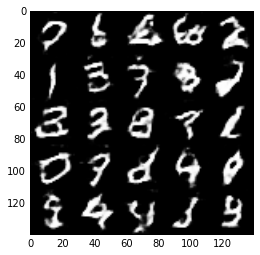

Epoch 2/2... Discriminator Loss: 0.2267... Generator Loss: 2.7917
Epoch 2/2... Discriminator Loss: 0.0939... Generator Loss: 2.6290
Epoch 2/2... Discriminator Loss: 0.1774... Generator Loss: 2.6165
Epoch 2/2... Discriminator Loss: 0.0592... Generator Loss: 3.6543
Epoch 2/2... Discriminator Loss: 0.1251... Generator Loss: 4.0598
Epoch 2/2... Discriminator Loss: 0.2995... Generator Loss: 4.1851
Epoch 2/2... Discriminator Loss: 1.3418... Generator Loss: 4.9004
Epoch 2/2... Discriminator Loss: 0.2873... Generator Loss: 1.6959
Epoch 2/2... Discriminator Loss: 0.1856... Generator Loss: 2.9455
Epoch 2/2... Discriminator Loss: 0.0945... Generator Loss: 2.3154


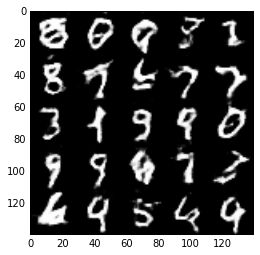

Epoch 2/2... Discriminator Loss: 0.1030... Generator Loss: 2.9398
Epoch 2/2... Discriminator Loss: 0.1240... Generator Loss: 3.2304
Epoch 2/2... Discriminator Loss: 0.1485... Generator Loss: 3.3231
Epoch 2/2... Discriminator Loss: 0.2393... Generator Loss: 1.7323
Epoch 2/2... Discriminator Loss: 0.0699... Generator Loss: 3.5711
Epoch 2/2... Discriminator Loss: 0.1275... Generator Loss: 3.5780
Epoch 2/2... Discriminator Loss: 0.1228... Generator Loss: 2.9187
Epoch 2/2... Discriminator Loss: 0.0937... Generator Loss: 2.8856
Epoch 2/2... Discriminator Loss: 0.0700... Generator Loss: 3.6334
Epoch 2/2... Discriminator Loss: 0.0835... Generator Loss: 3.0697


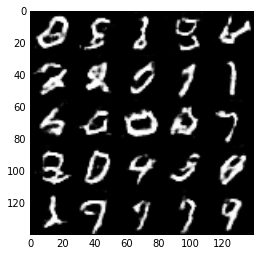

Epoch 2/2... Discriminator Loss: 0.1043... Generator Loss: 4.8392
Epoch 2/2... Discriminator Loss: 0.0733... Generator Loss: 3.4547
Epoch 2/2... Discriminator Loss: 0.1577... Generator Loss: 2.6499
Epoch 2/2... Discriminator Loss: 5.7498... Generator Loss: 9.3658
Epoch 2/2... Discriminator Loss: 1.0783... Generator Loss: 4.1095
Epoch 2/2... Discriminator Loss: 0.4003... Generator Loss: 3.2776
Epoch 2/2... Discriminator Loss: 0.6523... Generator Loss: 4.6348
Epoch 2/2... Discriminator Loss: 0.1829... Generator Loss: 3.5409
Epoch 2/2... Discriminator Loss: 0.1809... Generator Loss: 2.7477
Epoch 2/2... Discriminator Loss: 0.1959... Generator Loss: 2.3260


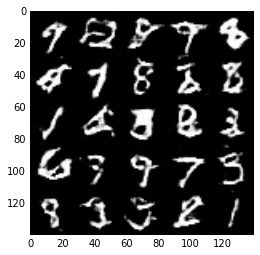

Epoch 2/2... Discriminator Loss: 0.1560... Generator Loss: 2.8523
Epoch 2/2... Discriminator Loss: 0.0630... Generator Loss: 3.2578
Epoch 2/2... Discriminator Loss: 0.1511... Generator Loss: 2.6710
Epoch 2/2... Discriminator Loss: 0.1434... Generator Loss: 2.8571
Epoch 2/2... Discriminator Loss: 0.1092... Generator Loss: 3.4208
Epoch 2/2... Discriminator Loss: 0.1340... Generator Loss: 2.6821
Epoch 2/2... Discriminator Loss: 0.1530... Generator Loss: 3.0522
Epoch 2/2... Discriminator Loss: 0.1605... Generator Loss: 3.6374
Epoch 2/2... Discriminator Loss: 0.1197... Generator Loss: 3.2546
Epoch 2/2... Discriminator Loss: 0.1145... Generator Loss: 2.6548


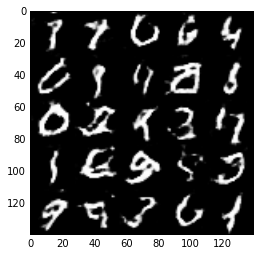

Epoch 2/2... Discriminator Loss: 0.1171... Generator Loss: 3.1969
Epoch 2/2... Discriminator Loss: 0.0642... Generator Loss: 3.1759
Epoch 2/2... Discriminator Loss: 0.0904... Generator Loss: 2.9870
Epoch 2/2... Discriminator Loss: 0.1046... Generator Loss: 3.1095
Epoch 2/2... Discriminator Loss: 0.0463... Generator Loss: 3.5388
Epoch 2/2... Discriminator Loss: 0.0699... Generator Loss: 3.2315
Epoch 2/2... Discriminator Loss: 0.9947... Generator Loss: 0.8290
Epoch 2/2... Discriminator Loss: 0.1194... Generator Loss: 3.1293
Epoch 2/2... Discriminator Loss: 0.0807... Generator Loss: 3.8130
Epoch 2/2... Discriminator Loss: 0.0936... Generator Loss: 4.0135


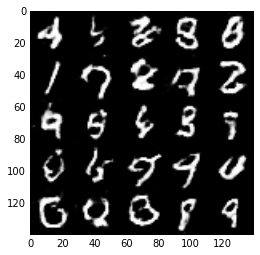

Epoch 2/2... Discriminator Loss: 0.1157... Generator Loss: 3.5100
Epoch 2/2... Discriminator Loss: 0.4686... Generator Loss: 2.1001
Epoch 2/2... Discriminator Loss: 0.1502... Generator Loss: 2.9681
Epoch 2/2... Discriminator Loss: 0.0826... Generator Loss: 2.9585
Epoch 2/2... Discriminator Loss: 0.0798... Generator Loss: 3.7956
Epoch 2/2... Discriminator Loss: 0.1172... Generator Loss: 3.2328
Epoch 2/2... Discriminator Loss: 0.3299... Generator Loss: 1.3588
Epoch 2/2... Discriminator Loss: 3.1257... Generator Loss: 0.0746
Epoch 2/2... Discriminator Loss: 0.3513... Generator Loss: 1.6198
Epoch 2/2... Discriminator Loss: 0.0954... Generator Loss: 3.3508


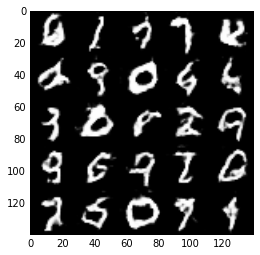

Epoch 2/2... Discriminator Loss: 0.1747... Generator Loss: 3.1249
Epoch 2/2... Discriminator Loss: 0.1066... Generator Loss: 3.0251
Epoch 2/2... Discriminator Loss: 0.1389... Generator Loss: 3.5044
Epoch 2/2... Discriminator Loss: 0.0966... Generator Loss: 2.9145
Epoch 2/2... Discriminator Loss: 0.0743... Generator Loss: 3.4119


In [ ]:
batch_size = 32
z_dim = 100
learning_rate = 0.0001
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 0.1775... Generator Loss: 2.5398
Epoch 1/1... Discriminator Loss: 0.0806... Generator Loss: 3.3181
Epoch 1/1... Discriminator Loss: 0.0534... Generator Loss: 3.3062
Epoch 1/1... Discriminator Loss: 0.0493... Generator Loss: 3.9465
Epoch 1/1... Discriminator Loss: 0.0327... Generator Loss: 4.2681
Epoch 1/1... Discriminator Loss: 0.0365... Generator Loss: 4.1115
Epoch 1/1... Discriminator Loss: 0.0300... Generator Loss: 4.6834
Epoch 1/1... Discriminator Loss: 0.0427... Generator Loss: 5.2686
Epoch 1/1... Discriminator Loss: 0.0669... Generator Loss: 3.3581
Epoch 1/1... Discriminator Loss: 0.0472... Generator Loss: 3.7590


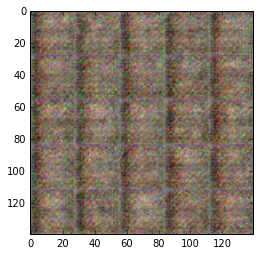

Epoch 1/1... Discriminator Loss: 0.0436... Generator Loss: 5.5580
Epoch 1/1... Discriminator Loss: 0.0322... Generator Loss: 5.0696
Epoch 1/1... Discriminator Loss: 0.0161... Generator Loss: 4.5644
Epoch 1/1... Discriminator Loss: 0.0864... Generator Loss: 5.6445
Epoch 1/1... Discriminator Loss: 0.6434... Generator Loss: 1.6361
Epoch 1/1... Discriminator Loss: 0.0464... Generator Loss: 5.1840
Epoch 1/1... Discriminator Loss: 0.0542... Generator Loss: 3.9029
Epoch 1/1... Discriminator Loss: 0.0522... Generator Loss: 5.5908
Epoch 1/1... Discriminator Loss: 0.0906... Generator Loss: 5.6884
Epoch 1/1... Discriminator Loss: 0.0328... Generator Loss: 4.5091


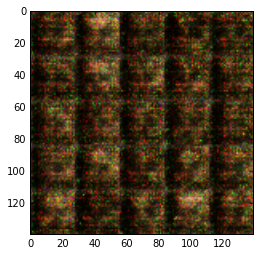

Epoch 1/1... Discriminator Loss: 0.0628... Generator Loss: 4.2565
Epoch 1/1... Discriminator Loss: 0.0564... Generator Loss: 3.5330
Epoch 1/1... Discriminator Loss: 0.0758... Generator Loss: 3.5439
Epoch 1/1... Discriminator Loss: 0.0503... Generator Loss: 3.9276
Epoch 1/1... Discriminator Loss: 0.0506... Generator Loss: 3.2195
Epoch 1/1... Discriminator Loss: 0.0741... Generator Loss: 3.7774
Epoch 1/1... Discriminator Loss: 0.1782... Generator Loss: 2.1895
Epoch 1/1... Discriminator Loss: 0.0998... Generator Loss: 3.6393
Epoch 1/1... Discriminator Loss: 0.1313... Generator Loss: 2.7692
Epoch 1/1... Discriminator Loss: 0.0817... Generator Loss: 3.2154


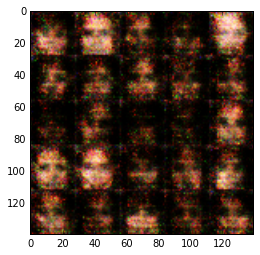

Epoch 1/1... Discriminator Loss: 0.1205... Generator Loss: 3.7771
Epoch 1/1... Discriminator Loss: 0.0860... Generator Loss: 3.4153
Epoch 1/1... Discriminator Loss: 0.2114... Generator Loss: 2.1716
Epoch 1/1... Discriminator Loss: 0.0633... Generator Loss: 3.4255
Epoch 1/1... Discriminator Loss: 0.0563... Generator Loss: 3.8577
Epoch 1/1... Discriminator Loss: 0.1314... Generator Loss: 3.0414
Epoch 1/1... Discriminator Loss: 0.0406... Generator Loss: 3.8238
Epoch 1/1... Discriminator Loss: 0.0974... Generator Loss: 3.3767
Epoch 1/1... Discriminator Loss: 0.0745... Generator Loss: 5.0525
Epoch 1/1... Discriminator Loss: 0.0594... Generator Loss: 3.8953


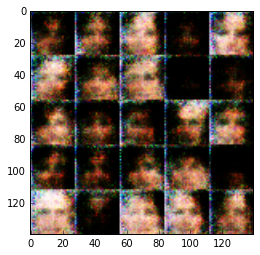

Epoch 1/1... Discriminator Loss: 0.0615... Generator Loss: 3.5958
Epoch 1/1... Discriminator Loss: 2.4326... Generator Loss: 13.0072
Epoch 1/1... Discriminator Loss: 0.1058... Generator Loss: 3.3661
Epoch 1/1... Discriminator Loss: 0.2294... Generator Loss: 5.6991
Epoch 1/1... Discriminator Loss: 0.0548... Generator Loss: 3.3547
Epoch 1/1... Discriminator Loss: 0.0609... Generator Loss: 3.8832
Epoch 1/1... Discriminator Loss: 1.0251... Generator Loss: 11.3985
Epoch 1/1... Discriminator Loss: 0.1175... Generator Loss: 3.6707
Epoch 1/1... Discriminator Loss: 0.0793... Generator Loss: 3.7845
Epoch 1/1... Discriminator Loss: 0.0568... Generator Loss: 3.6737


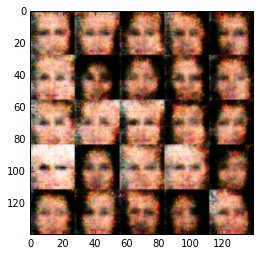

Epoch 1/1... Discriminator Loss: 0.0894... Generator Loss: 3.2272
Epoch 1/1... Discriminator Loss: 0.0323... Generator Loss: 4.4209
Epoch 1/1... Discriminator Loss: 0.0648... Generator Loss: 3.3400
Epoch 1/1... Discriminator Loss: 0.0708... Generator Loss: 3.3591
Epoch 1/1... Discriminator Loss: 0.0706... Generator Loss: 3.4263
Epoch 1/1... Discriminator Loss: 0.1210... Generator Loss: 3.3613
Epoch 1/1... Discriminator Loss: 0.0783... Generator Loss: 3.4949
Epoch 1/1... Discriminator Loss: 0.0524... Generator Loss: 4.2065
Epoch 1/1... Discriminator Loss: 0.2250... Generator Loss: 1.8265
Epoch 1/1... Discriminator Loss: 0.0356... Generator Loss: 4.2409


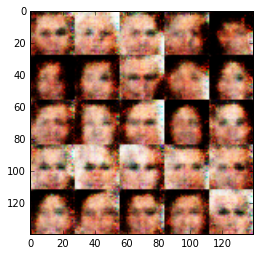

Epoch 1/1... Discriminator Loss: 0.0585... Generator Loss: 3.7406
Epoch 1/1... Discriminator Loss: 0.1242... Generator Loss: 2.5673
Epoch 1/1... Discriminator Loss: 2.7309... Generator Loss: 9.9553
Epoch 1/1... Discriminator Loss: 0.1309... Generator Loss: 3.4724
Epoch 1/1... Discriminator Loss: 0.1685... Generator Loss: 4.8822
Epoch 1/1... Discriminator Loss: 0.1080... Generator Loss: 3.6480
Epoch 1/1... Discriminator Loss: 0.0915... Generator Loss: 2.9399
Epoch 1/1... Discriminator Loss: 0.0991... Generator Loss: 3.1427
Epoch 1/1... Discriminator Loss: 0.0988... Generator Loss: 3.1069
Epoch 1/1... Discriminator Loss: 0.1155... Generator Loss: 5.2662


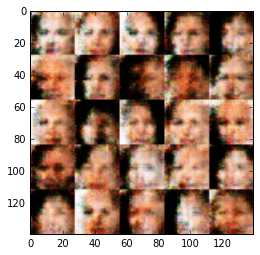

Epoch 1/1... Discriminator Loss: 0.0769... Generator Loss: 3.8259
Epoch 1/1... Discriminator Loss: 0.0933... Generator Loss: 4.0335
Epoch 1/1... Discriminator Loss: 0.0924... Generator Loss: 3.0081
Epoch 1/1... Discriminator Loss: 0.0733... Generator Loss: 3.8347
Epoch 1/1... Discriminator Loss: 0.1355... Generator Loss: 3.1811
Epoch 1/1... Discriminator Loss: 0.1212... Generator Loss: 2.5310
Epoch 1/1... Discriminator Loss: 0.1233... Generator Loss: 3.1134
Epoch 1/1... Discriminator Loss: 0.0233... Generator Loss: 4.8303
Epoch 1/1... Discriminator Loss: 0.0665... Generator Loss: 3.5123
Epoch 1/1... Discriminator Loss: 0.0554... Generator Loss: 4.4434


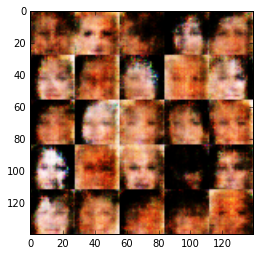

Epoch 1/1... Discriminator Loss: 0.2860... Generator Loss: 3.8071
Epoch 1/1... Discriminator Loss: 0.3117... Generator Loss: 2.0172
Epoch 1/1... Discriminator Loss: 0.0876... Generator Loss: 3.2076
Epoch 1/1... Discriminator Loss: 0.1290... Generator Loss: 3.1034
Epoch 1/1... Discriminator Loss: 0.0943... Generator Loss: 3.0402
Epoch 1/1... Discriminator Loss: 0.1196... Generator Loss: 3.1646
Epoch 1/1... Discriminator Loss: 0.2113... Generator Loss: 4.7553
Epoch 1/1... Discriminator Loss: 0.0633... Generator Loss: 3.0481
Epoch 1/1... Discriminator Loss: 0.0596... Generator Loss: 3.8592
Epoch 1/1... Discriminator Loss: 0.0916... Generator Loss: 3.4887


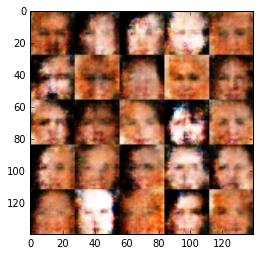

Epoch 1/1... Discriminator Loss: 0.1055... Generator Loss: 3.3568
Epoch 1/1... Discriminator Loss: 0.0919... Generator Loss: 3.0178
Epoch 1/1... Discriminator Loss: 0.1906... Generator Loss: 2.1856
Epoch 1/1... Discriminator Loss: 0.1194... Generator Loss: 3.2881
Epoch 1/1... Discriminator Loss: 0.1031... Generator Loss: 2.9473
Epoch 1/1... Discriminator Loss: 0.1157... Generator Loss: 3.5915
Epoch 1/1... Discriminator Loss: 0.0798... Generator Loss: 5.5477
Epoch 1/1... Discriminator Loss: 0.2968... Generator Loss: 1.8499
Epoch 1/1... Discriminator Loss: 0.2643... Generator Loss: 1.8866
Epoch 1/1... Discriminator Loss: 0.9173... Generator Loss: 0.9446


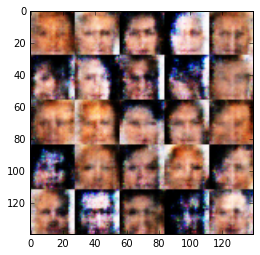

Epoch 1/1... Discriminator Loss: 0.1686... Generator Loss: 2.5771
Epoch 1/1... Discriminator Loss: 0.9117... Generator Loss: 0.8703
Epoch 1/1... Discriminator Loss: 0.1103... Generator Loss: 3.9411
Epoch 1/1... Discriminator Loss: 0.0814... Generator Loss: 2.7358
Epoch 1/1... Discriminator Loss: 0.2127... Generator Loss: 3.9119
Epoch 1/1... Discriminator Loss: 0.2167... Generator Loss: 2.2282
Epoch 1/1... Discriminator Loss: 0.2339... Generator Loss: 2.2178
Epoch 1/1... Discriminator Loss: 0.2113... Generator Loss: 3.1745
Epoch 1/1... Discriminator Loss: 0.1328... Generator Loss: 3.4717
Epoch 1/1... Discriminator Loss: 0.1895... Generator Loss: 2.9309


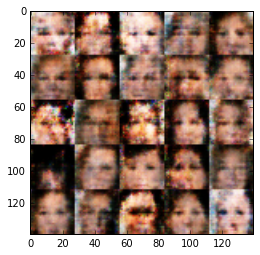

Epoch 1/1... Discriminator Loss: 0.1661... Generator Loss: 3.8409
Epoch 1/1... Discriminator Loss: 0.0951... Generator Loss: 4.1456
Epoch 1/1... Discriminator Loss: 0.2605... Generator Loss: 2.0065
Epoch 1/1... Discriminator Loss: 0.6488... Generator Loss: 1.0681
Epoch 1/1... Discriminator Loss: 0.2445... Generator Loss: 2.5250
Epoch 1/1... Discriminator Loss: 1.6650... Generator Loss: 0.6702
Epoch 1/1... Discriminator Loss: 0.2261... Generator Loss: 2.4084
Epoch 1/1... Discriminator Loss: 0.4564... Generator Loss: 2.4364
Epoch 1/1... Discriminator Loss: 0.3725... Generator Loss: 1.8664
Epoch 1/1... Discriminator Loss: 0.1716... Generator Loss: 3.2326


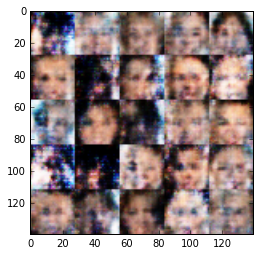

Epoch 1/1... Discriminator Loss: 0.2483... Generator Loss: 3.1947
Epoch 1/1... Discriminator Loss: 0.2439... Generator Loss: 3.2755
Epoch 1/1... Discriminator Loss: 0.2244... Generator Loss: 3.3860
Epoch 1/1... Discriminator Loss: 0.3182... Generator Loss: 1.5779
Epoch 1/1... Discriminator Loss: 0.2715... Generator Loss: 2.0168
Epoch 1/1... Discriminator Loss: 0.2380... Generator Loss: 2.6901
Epoch 1/1... Discriminator Loss: 0.2053... Generator Loss: 2.4560
Epoch 1/1... Discriminator Loss: 0.2177... Generator Loss: 2.8107
Epoch 1/1... Discriminator Loss: 0.4374... Generator Loss: 4.9356
Epoch 1/1... Discriminator Loss: 0.3051... Generator Loss: 3.5178


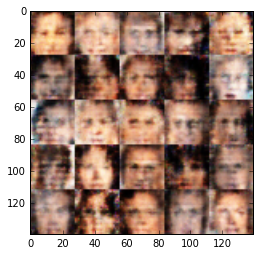

Epoch 1/1... Discriminator Loss: 0.4381... Generator Loss: 1.5205
Epoch 1/1... Discriminator Loss: 0.2018... Generator Loss: 3.1669
Epoch 1/1... Discriminator Loss: 0.2082... Generator Loss: 3.0449
Epoch 1/1... Discriminator Loss: 0.4004... Generator Loss: 3.5055
Epoch 1/1... Discriminator Loss: 0.2281... Generator Loss: 2.9264
Epoch 1/1... Discriminator Loss: 0.5245... Generator Loss: 5.0111
Epoch 1/1... Discriminator Loss: 0.2802... Generator Loss: 2.6664
Epoch 1/1... Discriminator Loss: 0.4473... Generator Loss: 1.5741
Epoch 1/1... Discriminator Loss: 0.2402... Generator Loss: 2.4426
Epoch 1/1... Discriminator Loss: 0.2020... Generator Loss: 2.9427


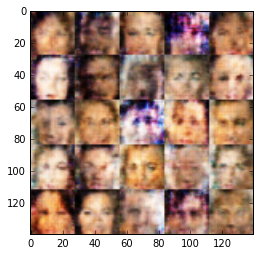

Epoch 1/1... Discriminator Loss: 0.2868... Generator Loss: 2.7236
Epoch 1/1... Discriminator Loss: 0.9613... Generator Loss: 0.9391
Epoch 1/1... Discriminator Loss: 0.4068... Generator Loss: 1.6508
Epoch 1/1... Discriminator Loss: 0.2592... Generator Loss: 2.4861
Epoch 1/1... Discriminator Loss: 0.3129... Generator Loss: 1.9191
Epoch 1/1... Discriminator Loss: 0.3941... Generator Loss: 2.0714
Epoch 1/1... Discriminator Loss: 1.1075... Generator Loss: 0.6027
Epoch 1/1... Discriminator Loss: 0.2521... Generator Loss: 2.8096
Epoch 1/1... Discriminator Loss: 0.2590... Generator Loss: 3.2358
Epoch 1/1... Discriminator Loss: 0.1575... Generator Loss: 2.5850


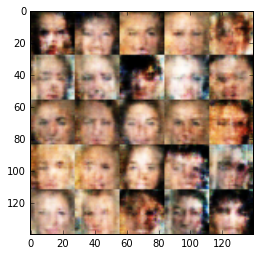

Epoch 1/1... Discriminator Loss: 0.4763... Generator Loss: 1.1863
Epoch 1/1... Discriminator Loss: 0.4017... Generator Loss: 2.0613
Epoch 1/1... Discriminator Loss: 0.2277... Generator Loss: 2.1141
Epoch 1/1... Discriminator Loss: 0.4289... Generator Loss: 1.8750
Epoch 1/1... Discriminator Loss: 0.7225... Generator Loss: 1.2695
Epoch 1/1... Discriminator Loss: 0.3613... Generator Loss: 3.8004
Epoch 1/1... Discriminator Loss: 0.4011... Generator Loss: 2.7939
Epoch 1/1... Discriminator Loss: 0.4020... Generator Loss: 2.5997
Epoch 1/1... Discriminator Loss: 0.4089... Generator Loss: 2.1565
Epoch 1/1... Discriminator Loss: 0.3892... Generator Loss: 2.9963


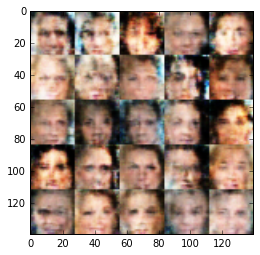

Epoch 1/1... Discriminator Loss: 0.2915... Generator Loss: 3.6911
Epoch 1/1... Discriminator Loss: 0.2726... Generator Loss: 3.2172
Epoch 1/1... Discriminator Loss: 0.2572... Generator Loss: 3.5554
Epoch 1/1... Discriminator Loss: 0.2506... Generator Loss: 2.4191
Epoch 1/1... Discriminator Loss: 0.4472... Generator Loss: 4.0886
Epoch 1/1... Discriminator Loss: 0.3768... Generator Loss: 2.0312
Epoch 1/1... Discriminator Loss: 0.3150... Generator Loss: 2.9037
Epoch 1/1... Discriminator Loss: 0.5778... Generator Loss: 1.1161
Epoch 1/1... Discriminator Loss: 0.3253... Generator Loss: 2.2930
Epoch 1/1... Discriminator Loss: 0.5815... Generator Loss: 1.2577


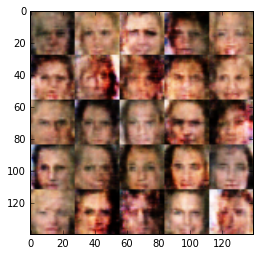

Epoch 1/1... Discriminator Loss: 0.2893... Generator Loss: 2.3338
Epoch 1/1... Discriminator Loss: 0.3934... Generator Loss: 3.9653
Epoch 1/1... Discriminator Loss: 0.8806... Generator Loss: 0.9315
Epoch 1/1... Discriminator Loss: 0.4737... Generator Loss: 1.7367
Epoch 1/1... Discriminator Loss: 0.6070... Generator Loss: 1.2120
Epoch 1/1... Discriminator Loss: 0.3605... Generator Loss: 1.6621
Epoch 1/1... Discriminator Loss: 0.3313... Generator Loss: 1.6842
Epoch 1/1... Discriminator Loss: 0.8169... Generator Loss: 1.0014
Epoch 1/1... Discriminator Loss: 0.4104... Generator Loss: 2.1854
Epoch 1/1... Discriminator Loss: 0.2832... Generator Loss: 2.6827


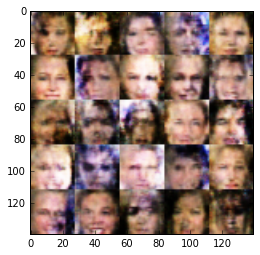

Epoch 1/1... Discriminator Loss: 1.2428... Generator Loss: 0.5612
Epoch 1/1... Discriminator Loss: 0.4284... Generator Loss: 1.4774
Epoch 1/1... Discriminator Loss: 0.3969... Generator Loss: 1.5903
Epoch 1/1... Discriminator Loss: 0.2483... Generator Loss: 3.4188
Epoch 1/1... Discriminator Loss: 0.3006... Generator Loss: 2.2517
Epoch 1/1... Discriminator Loss: 0.7906... Generator Loss: 0.9419
Epoch 1/1... Discriminator Loss: 0.7963... Generator Loss: 1.5585
Epoch 1/1... Discriminator Loss: 0.2497... Generator Loss: 1.8296
Epoch 1/1... Discriminator Loss: 0.9267... Generator Loss: 4.5249
Epoch 1/1... Discriminator Loss: 0.2834... Generator Loss: 2.9358


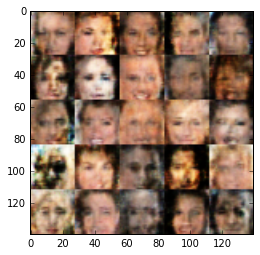

Epoch 1/1... Discriminator Loss: 0.3881... Generator Loss: 3.0965
Epoch 1/1... Discriminator Loss: 0.7082... Generator Loss: 4.2189
Epoch 1/1... Discriminator Loss: 0.3532... Generator Loss: 1.8709
Epoch 1/1... Discriminator Loss: 0.2774... Generator Loss: 2.2793
Epoch 1/1... Discriminator Loss: 0.2613... Generator Loss: 3.3759
Epoch 1/1... Discriminator Loss: 0.2941... Generator Loss: 2.0764
Epoch 1/1... Discriminator Loss: 0.2908... Generator Loss: 1.9241
Epoch 1/1... Discriminator Loss: 0.6699... Generator Loss: 1.1054
Epoch 1/1... Discriminator Loss: 0.4132... Generator Loss: 1.6999
Epoch 1/1... Discriminator Loss: 0.3490... Generator Loss: 1.6336


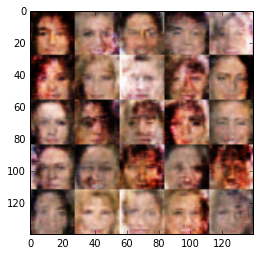

Epoch 1/1... Discriminator Loss: 0.4841... Generator Loss: 1.4699
Epoch 1/1... Discriminator Loss: 0.4340... Generator Loss: 1.2921
Epoch 1/1... Discriminator Loss: 0.6344... Generator Loss: 1.2703
Epoch 1/1... Discriminator Loss: 0.4219... Generator Loss: 1.8685
Epoch 1/1... Discriminator Loss: 0.2944... Generator Loss: 3.1090
Epoch 1/1... Discriminator Loss: 0.5036... Generator Loss: 1.3056
Epoch 1/1... Discriminator Loss: 0.2995... Generator Loss: 2.4600
Epoch 1/1... Discriminator Loss: 0.3381... Generator Loss: 1.7024
Epoch 1/1... Discriminator Loss: 0.3927... Generator Loss: 1.8032
Epoch 1/1... Discriminator Loss: 0.2324... Generator Loss: 2.5615


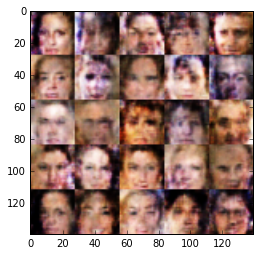

Epoch 1/1... Discriminator Loss: 0.4958... Generator Loss: 1.6142
Epoch 1/1... Discriminator Loss: 0.4461... Generator Loss: 1.2495
Epoch 1/1... Discriminator Loss: 0.3010... Generator Loss: 1.9813
Epoch 1/1... Discriminator Loss: 0.2307... Generator Loss: 2.0792
Epoch 1/1... Discriminator Loss: 0.2860... Generator Loss: 2.3549
Epoch 1/1... Discriminator Loss: 0.3726... Generator Loss: 1.5771
Epoch 1/1... Discriminator Loss: 0.2593... Generator Loss: 2.3811
Epoch 1/1... Discriminator Loss: 0.3642... Generator Loss: 2.5575
Epoch 1/1... Discriminator Loss: 0.3637... Generator Loss: 1.9170
Epoch 1/1... Discriminator Loss: 0.7628... Generator Loss: 4.1522


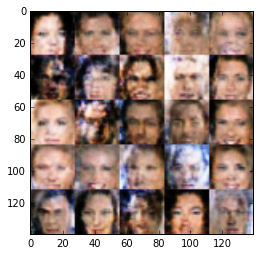

Epoch 1/1... Discriminator Loss: 0.3268... Generator Loss: 2.1384
Epoch 1/1... Discriminator Loss: 0.5037... Generator Loss: 4.0012
Epoch 1/1... Discriminator Loss: 0.4269... Generator Loss: 3.2543
Epoch 1/1... Discriminator Loss: 0.2515... Generator Loss: 2.2009
Epoch 1/1... Discriminator Loss: 0.3383... Generator Loss: 2.9928
Epoch 1/1... Discriminator Loss: 0.4017... Generator Loss: 1.5856
Epoch 1/1... Discriminator Loss: 0.3572... Generator Loss: 2.4324
Epoch 1/1... Discriminator Loss: 0.4019... Generator Loss: 1.6101
Epoch 1/1... Discriminator Loss: 0.4206... Generator Loss: 1.6404
Epoch 1/1... Discriminator Loss: 0.6240... Generator Loss: 1.1838


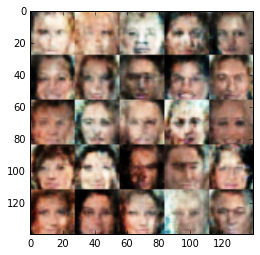

Epoch 1/1... Discriminator Loss: 0.2705... Generator Loss: 2.4167
Epoch 1/1... Discriminator Loss: 0.4804... Generator Loss: 3.5904
Epoch 1/1... Discriminator Loss: 0.3071... Generator Loss: 2.7299
Epoch 1/1... Discriminator Loss: 0.2523... Generator Loss: 2.7294
Epoch 1/1... Discriminator Loss: 0.4283... Generator Loss: 1.6715
Epoch 1/1... Discriminator Loss: 0.3422... Generator Loss: 1.6747
Epoch 1/1... Discriminator Loss: 0.2994... Generator Loss: 1.8513
Epoch 1/1... Discriminator Loss: 0.2026... Generator Loss: 2.6216
Epoch 1/1... Discriminator Loss: 0.2475... Generator Loss: 2.5689
Epoch 1/1... Discriminator Loss: 0.3716... Generator Loss: 3.0187


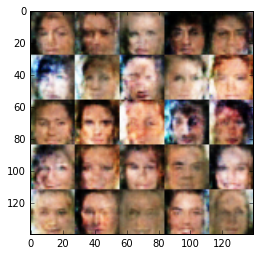

Epoch 1/1... Discriminator Loss: 0.3485... Generator Loss: 1.5870
Epoch 1/1... Discriminator Loss: 0.3885... Generator Loss: 2.9509
Epoch 1/1... Discriminator Loss: 0.4170... Generator Loss: 1.3822
Epoch 1/1... Discriminator Loss: 0.6361... Generator Loss: 1.1685
Epoch 1/1... Discriminator Loss: 0.1860... Generator Loss: 3.2177
Epoch 1/1... Discriminator Loss: 0.2560... Generator Loss: 2.3407
Epoch 1/1... Discriminator Loss: 0.3706... Generator Loss: 1.7011
Epoch 1/1... Discriminator Loss: 0.3148... Generator Loss: 2.9840
Epoch 1/1... Discriminator Loss: 0.2522... Generator Loss: 1.9537
Epoch 1/1... Discriminator Loss: 0.3863... Generator Loss: 1.5594


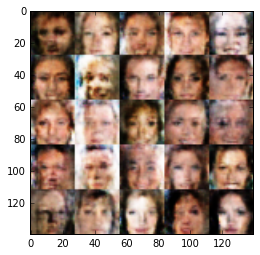

Epoch 1/1... Discriminator Loss: 0.2478... Generator Loss: 3.1001
Epoch 1/1... Discriminator Loss: 0.5556... Generator Loss: 3.3812
Epoch 1/1... Discriminator Loss: 0.2706... Generator Loss: 2.0687
Epoch 1/1... Discriminator Loss: 0.2703... Generator Loss: 2.1145
Epoch 1/1... Discriminator Loss: 0.3147... Generator Loss: 1.8891
Epoch 1/1... Discriminator Loss: 0.2843... Generator Loss: 1.7815
Epoch 1/1... Discriminator Loss: 0.2894... Generator Loss: 1.8700
Epoch 1/1... Discriminator Loss: 0.2364... Generator Loss: 2.7299
Epoch 1/1... Discriminator Loss: 0.2167... Generator Loss: 2.6489
Epoch 1/1... Discriminator Loss: 0.2398... Generator Loss: 2.5391


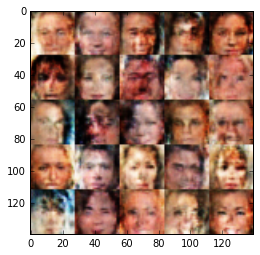

Epoch 1/1... Discriminator Loss: 0.2667... Generator Loss: 2.6112
Epoch 1/1... Discriminator Loss: 0.7477... Generator Loss: 4.4261
Epoch 1/1... Discriminator Loss: 0.4014... Generator Loss: 3.5702
Epoch 1/1... Discriminator Loss: 0.3255... Generator Loss: 2.4518
Epoch 1/1... Discriminator Loss: 0.3591... Generator Loss: 1.6958
Epoch 1/1... Discriminator Loss: 0.2867... Generator Loss: 2.2612
Epoch 1/1... Discriminator Loss: 0.2588... Generator Loss: 2.3118
Epoch 1/1... Discriminator Loss: 0.5462... Generator Loss: 3.8144
Epoch 1/1... Discriminator Loss: 0.3187... Generator Loss: 3.1869
Epoch 1/1... Discriminator Loss: 0.3088... Generator Loss: 2.4534


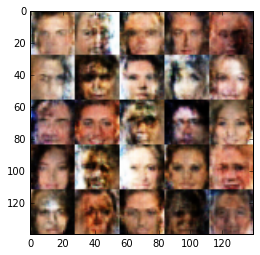

Epoch 1/1... Discriminator Loss: 0.3062... Generator Loss: 2.7096
Epoch 1/1... Discriminator Loss: 0.4498... Generator Loss: 1.6530
Epoch 1/1... Discriminator Loss: 0.2854... Generator Loss: 2.7428
Epoch 1/1... Discriminator Loss: 0.3035... Generator Loss: 2.1926
Epoch 1/1... Discriminator Loss: 0.4009... Generator Loss: 1.7280
Epoch 1/1... Discriminator Loss: 0.3113... Generator Loss: 2.6811
Epoch 1/1... Discriminator Loss: 0.2578... Generator Loss: 2.0191
Epoch 1/1... Discriminator Loss: 0.2789... Generator Loss: 1.9131
Epoch 1/1... Discriminator Loss: 0.7938... Generator Loss: 0.6554
Epoch 1/1... Discriminator Loss: 0.2706... Generator Loss: 2.0501


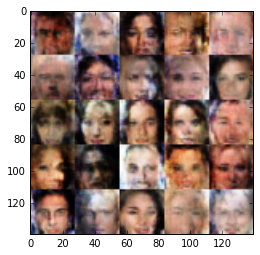

Epoch 1/1... Discriminator Loss: 0.2953... Generator Loss: 2.3784
Epoch 1/1... Discriminator Loss: 0.4542... Generator Loss: 1.1404
Epoch 1/1... Discriminator Loss: 0.2902... Generator Loss: 2.6360
Epoch 1/1... Discriminator Loss: 0.2534... Generator Loss: 2.6276
Epoch 1/1... Discriminator Loss: 0.2949... Generator Loss: 2.1792
Epoch 1/1... Discriminator Loss: 0.5522... Generator Loss: 1.3366
Epoch 1/1... Discriminator Loss: 0.3003... Generator Loss: 2.7792
Epoch 1/1... Discriminator Loss: 0.4470... Generator Loss: 1.0866
Epoch 1/1... Discriminator Loss: 0.3360... Generator Loss: 2.1994
Epoch 1/1... Discriminator Loss: 0.3122... Generator Loss: 2.2853


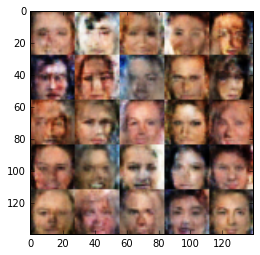

Epoch 1/1... Discriminator Loss: 0.8526... Generator Loss: 4.3752
Epoch 1/1... Discriminator Loss: 0.3074... Generator Loss: 2.3644
Epoch 1/1... Discriminator Loss: 0.2671... Generator Loss: 2.2629
Epoch 1/1... Discriminator Loss: 0.3714... Generator Loss: 2.0697
Epoch 1/1... Discriminator Loss: 0.5481... Generator Loss: 3.5633
Epoch 1/1... Discriminator Loss: 0.6289... Generator Loss: 1.0523
Epoch 1/1... Discriminator Loss: 0.3719... Generator Loss: 1.7645
Epoch 1/1... Discriminator Loss: 0.3583... Generator Loss: 2.4976
Epoch 1/1... Discriminator Loss: 0.2277... Generator Loss: 3.4152
Epoch 1/1... Discriminator Loss: 0.3144... Generator Loss: 2.1953


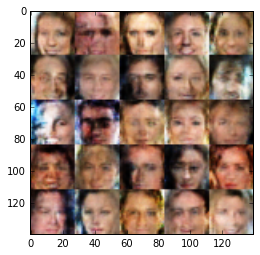

Epoch 1/1... Discriminator Loss: 0.4295... Generator Loss: 1.7058
Epoch 1/1... Discriminator Loss: 0.9777... Generator Loss: 0.5888
Epoch 1/1... Discriminator Loss: 0.4679... Generator Loss: 3.3879
Epoch 1/1... Discriminator Loss: 1.2787... Generator Loss: 0.4416
Epoch 1/1... Discriminator Loss: 0.6586... Generator Loss: 1.0841
Epoch 1/1... Discriminator Loss: 0.4013... Generator Loss: 2.7753
Epoch 1/1... Discriminator Loss: 0.3797... Generator Loss: 2.5700
Epoch 1/1... Discriminator Loss: 0.3081... Generator Loss: 2.3719
Epoch 1/1... Discriminator Loss: 0.2905... Generator Loss: 2.1187
Epoch 1/1... Discriminator Loss: 0.4185... Generator Loss: 1.5966


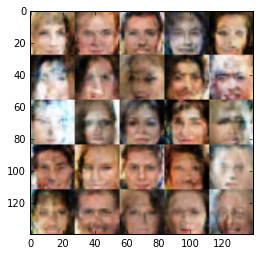

Epoch 1/1... Discriminator Loss: 0.4592... Generator Loss: 1.1995
Epoch 1/1... Discriminator Loss: 0.6524... Generator Loss: 1.3143
Epoch 1/1... Discriminator Loss: 0.4214... Generator Loss: 1.7386
Epoch 1/1... Discriminator Loss: 0.3737... Generator Loss: 1.8211
Epoch 1/1... Discriminator Loss: 1.3668... Generator Loss: 0.4579
Epoch 1/1... Discriminator Loss: 0.4004... Generator Loss: 1.6541
Epoch 1/1... Discriminator Loss: 0.4783... Generator Loss: 2.8603
Epoch 1/1... Discriminator Loss: 0.3516... Generator Loss: 1.7767
Epoch 1/1... Discriminator Loss: 0.4270... Generator Loss: 1.5968
Epoch 1/1... Discriminator Loss: 0.4298... Generator Loss: 1.4240


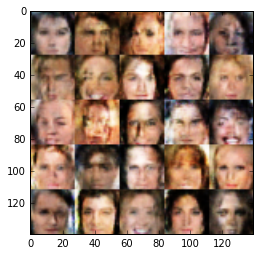

Epoch 1/1... Discriminator Loss: 0.2857... Generator Loss: 2.0394
Epoch 1/1... Discriminator Loss: 1.1105... Generator Loss: 0.6218
Epoch 1/1... Discriminator Loss: 0.6356... Generator Loss: 0.9791
Epoch 1/1... Discriminator Loss: 0.6618... Generator Loss: 1.1223
Epoch 1/1... Discriminator Loss: 0.2872... Generator Loss: 2.2236
Epoch 1/1... Discriminator Loss: 0.2661... Generator Loss: 2.1436
Epoch 1/1... Discriminator Loss: 0.4678... Generator Loss: 1.1731
Epoch 1/1... Discriminator Loss: 0.3867... Generator Loss: 1.9218
Epoch 1/1... Discriminator Loss: 0.4481... Generator Loss: 1.5644
Epoch 1/1... Discriminator Loss: 0.2556... Generator Loss: 2.2149


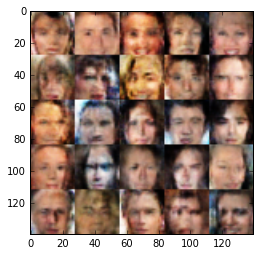

Epoch 1/1... Discriminator Loss: 0.2513... Generator Loss: 2.8769
Epoch 1/1... Discriminator Loss: 0.5247... Generator Loss: 3.3765
Epoch 1/1... Discriminator Loss: 0.2693... Generator Loss: 2.2604
Epoch 1/1... Discriminator Loss: 0.4217... Generator Loss: 3.3690
Epoch 1/1... Discriminator Loss: 0.4784... Generator Loss: 3.1128
Epoch 1/1... Discriminator Loss: 0.1585... Generator Loss: 2.8204
Epoch 1/1... Discriminator Loss: 0.4645... Generator Loss: 1.8642
Epoch 1/1... Discriminator Loss: 0.2983... Generator Loss: 2.4375
Epoch 1/1... Discriminator Loss: 0.3590... Generator Loss: 1.8757
Epoch 1/1... Discriminator Loss: 0.4112... Generator Loss: 2.6118


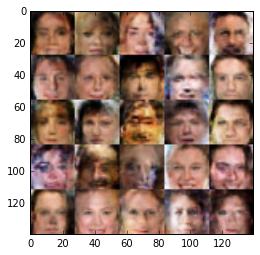

Epoch 1/1... Discriminator Loss: 0.3994... Generator Loss: 2.1028
Epoch 1/1... Discriminator Loss: 0.3473... Generator Loss: 2.1422
Epoch 1/1... Discriminator Loss: 0.5725... Generator Loss: 1.1860
Epoch 1/1... Discriminator Loss: 0.3199... Generator Loss: 2.3638
Epoch 1/1... Discriminator Loss: 0.6871... Generator Loss: 0.8240
Epoch 1/1... Discriminator Loss: 0.5606... Generator Loss: 3.9374
Epoch 1/1... Discriminator Loss: 0.3443... Generator Loss: 3.6141
Epoch 1/1... Discriminator Loss: 0.4810... Generator Loss: 1.2076
Epoch 1/1... Discriminator Loss: 0.3930... Generator Loss: 1.5490
Epoch 1/1... Discriminator Loss: 0.3407... Generator Loss: 2.4964


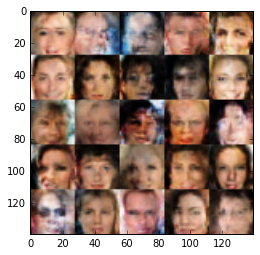

Epoch 1/1... Discriminator Loss: 0.9893... Generator Loss: 0.6853
Epoch 1/1... Discriminator Loss: 0.3427... Generator Loss: 1.8112
Epoch 1/1... Discriminator Loss: 0.2967... Generator Loss: 2.1889
Epoch 1/1... Discriminator Loss: 0.4405... Generator Loss: 1.3121
Epoch 1/1... Discriminator Loss: 0.4527... Generator Loss: 2.7848
Epoch 1/1... Discriminator Loss: 0.3065... Generator Loss: 2.2867
Epoch 1/1... Discriminator Loss: 0.6122... Generator Loss: 1.2690
Epoch 1/1... Discriminator Loss: 0.2695... Generator Loss: 2.2455
Epoch 1/1... Discriminator Loss: 0.4406... Generator Loss: 2.4450
Epoch 1/1... Discriminator Loss: 0.6395... Generator Loss: 0.5500


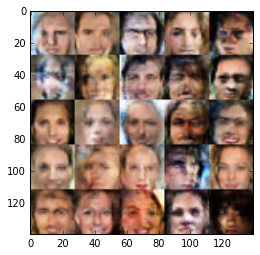

Epoch 1/1... Discriminator Loss: 0.2193... Generator Loss: 2.9423
Epoch 1/1... Discriminator Loss: 0.4234... Generator Loss: 2.6471
Epoch 1/1... Discriminator Loss: 0.8382... Generator Loss: 3.8352
Epoch 1/1... Discriminator Loss: 0.5160... Generator Loss: 1.3449
Epoch 1/1... Discriminator Loss: 0.4015... Generator Loss: 1.3290
Epoch 1/1... Discriminator Loss: 1.1191... Generator Loss: 0.7823
Epoch 1/1... Discriminator Loss: 0.4149... Generator Loss: 1.3778
Epoch 1/1... Discriminator Loss: 0.8152... Generator Loss: 4.0827
Epoch 1/1... Discriminator Loss: 0.3931... Generator Loss: 1.5028
Epoch 1/1... Discriminator Loss: 0.2434... Generator Loss: 2.3625


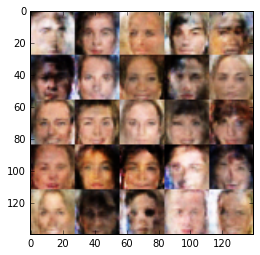

Epoch 1/1... Discriminator Loss: 0.3290... Generator Loss: 1.6994
Epoch 1/1... Discriminator Loss: 0.2954... Generator Loss: 1.9551
Epoch 1/1... Discriminator Loss: 0.4188... Generator Loss: 1.4243
Epoch 1/1... Discriminator Loss: 0.2914... Generator Loss: 2.0392
Epoch 1/1... Discriminator Loss: 1.8223... Generator Loss: 0.4052
Epoch 1/1... Discriminator Loss: 0.3496... Generator Loss: 1.6980
Epoch 1/1... Discriminator Loss: 0.6387... Generator Loss: 1.4505
Epoch 1/1... Discriminator Loss: 0.5187... Generator Loss: 3.3961
Epoch 1/1... Discriminator Loss: 0.3189... Generator Loss: 1.5483
Epoch 1/1... Discriminator Loss: 0.2660... Generator Loss: 2.7024


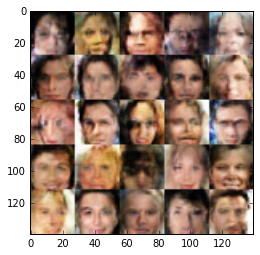

Epoch 1/1... Discriminator Loss: 0.4015... Generator Loss: 1.9782
Epoch 1/1... Discriminator Loss: 0.4844... Generator Loss: 2.1163
Epoch 1/1... Discriminator Loss: 0.4080... Generator Loss: 1.7788
Epoch 1/1... Discriminator Loss: 0.2877... Generator Loss: 1.9852
Epoch 1/1... Discriminator Loss: 0.4871... Generator Loss: 1.3031
Epoch 1/1... Discriminator Loss: 0.2964... Generator Loss: 2.3715
Epoch 1/1... Discriminator Loss: 0.7459... Generator Loss: 0.9173
Epoch 1/1... Discriminator Loss: 0.4153... Generator Loss: 2.8541
Epoch 1/1... Discriminator Loss: 0.3359... Generator Loss: 2.3803
Epoch 1/1... Discriminator Loss: 0.3294... Generator Loss: 1.7875


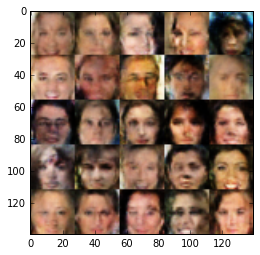

Epoch 1/1... Discriminator Loss: 0.2652... Generator Loss: 2.5585
Epoch 1/1... Discriminator Loss: 0.3871... Generator Loss: 1.8360
Epoch 1/1... Discriminator Loss: 0.8840... Generator Loss: 0.5861
Epoch 1/1... Discriminator Loss: 0.5072... Generator Loss: 1.3068
Epoch 1/1... Discriminator Loss: 0.3149... Generator Loss: 1.7711
Epoch 1/1... Discriminator Loss: 0.4003... Generator Loss: 1.4437
Epoch 1/1... Discriminator Loss: 0.3951... Generator Loss: 3.2638
Epoch 1/1... Discriminator Loss: 0.5518... Generator Loss: 1.1897
Epoch 1/1... Discriminator Loss: 0.4204... Generator Loss: 1.4462
Epoch 1/1... Discriminator Loss: 0.3050... Generator Loss: 1.8744


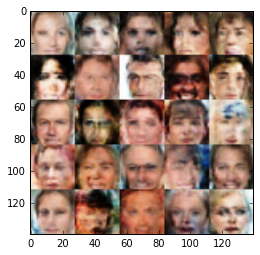

Epoch 1/1... Discriminator Loss: 0.2514... Generator Loss: 2.4747
Epoch 1/1... Discriminator Loss: 0.4690... Generator Loss: 1.5325
Epoch 1/1... Discriminator Loss: 0.4413... Generator Loss: 1.5162
Epoch 1/1... Discriminator Loss: 0.4795... Generator Loss: 1.2516
Epoch 1/1... Discriminator Loss: 0.2087... Generator Loss: 2.2981
Epoch 1/1... Discriminator Loss: 0.2520... Generator Loss: 1.7809
Epoch 1/1... Discriminator Loss: 0.8865... Generator Loss: 0.6428
Epoch 1/1... Discriminator Loss: 0.2876... Generator Loss: 1.5402
Epoch 1/1... Discriminator Loss: 0.4512... Generator Loss: 1.6286
Epoch 1/1... Discriminator Loss: 0.4881... Generator Loss: 1.4507


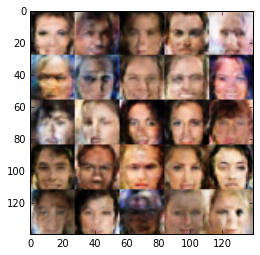

Epoch 1/1... Discriminator Loss: 0.2242... Generator Loss: 3.1568
Epoch 1/1... Discriminator Loss: 0.4312... Generator Loss: 3.1083
Epoch 1/1... Discriminator Loss: 0.3396... Generator Loss: 2.3084
Epoch 1/1... Discriminator Loss: 0.2241... Generator Loss: 1.9816
Epoch 1/1... Discriminator Loss: 0.2800... Generator Loss: 1.8411
Epoch 1/1... Discriminator Loss: 0.6590... Generator Loss: 4.0719
Epoch 1/1... Discriminator Loss: 0.3626... Generator Loss: 1.6872
Epoch 1/1... Discriminator Loss: 0.2365... Generator Loss: 1.6451
Epoch 1/1... Discriminator Loss: 0.3417... Generator Loss: 1.8942
Epoch 1/1... Discriminator Loss: 0.2756... Generator Loss: 1.8813


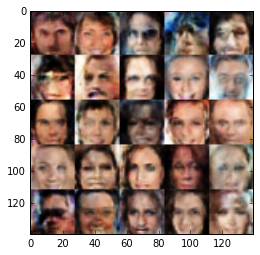

Epoch 1/1... Discriminator Loss: 0.5419... Generator Loss: 2.2702
Epoch 1/1... Discriminator Loss: 0.3226... Generator Loss: 2.1275
Epoch 1/1... Discriminator Loss: 0.3114... Generator Loss: 2.0327
Epoch 1/1... Discriminator Loss: 0.1842... Generator Loss: 1.9937
Epoch 1/1... Discriminator Loss: 0.2937... Generator Loss: 2.3505
Epoch 1/1... Discriminator Loss: 0.0975... Generator Loss: 3.4155
Epoch 1/1... Discriminator Loss: 0.2903... Generator Loss: 2.4062
Epoch 1/1... Discriminator Loss: 1.2147... Generator Loss: 0.4685
Epoch 1/1... Discriminator Loss: 0.9688... Generator Loss: 0.7049
Epoch 1/1... Discriminator Loss: 0.4333... Generator Loss: 1.8608


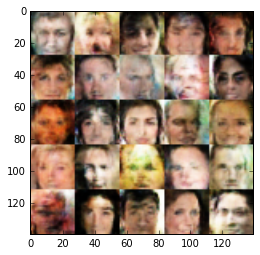

Epoch 1/1... Discriminator Loss: 0.5511... Generator Loss: 1.3616
Epoch 1/1... Discriminator Loss: 0.3012... Generator Loss: 1.7866
Epoch 1/1... Discriminator Loss: 0.2443... Generator Loss: 2.7720
Epoch 1/1... Discriminator Loss: 0.3241... Generator Loss: 2.4905
Epoch 1/1... Discriminator Loss: 0.3098... Generator Loss: 1.7059
Epoch 1/1... Discriminator Loss: 0.2512... Generator Loss: 1.8247
Epoch 1/1... Discriminator Loss: 0.3260... Generator Loss: 3.0436
Epoch 1/1... Discriminator Loss: 0.3465... Generator Loss: 2.6098
Epoch 1/1... Discriminator Loss: 0.2788... Generator Loss: 3.5627
Epoch 1/1... Discriminator Loss: 0.3641... Generator Loss: 1.8284


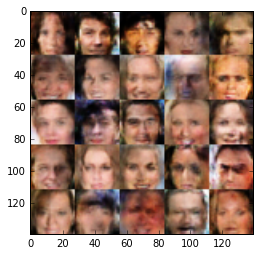

Epoch 1/1... Discriminator Loss: 0.1697... Generator Loss: 2.1413
Epoch 1/1... Discriminator Loss: 0.4861... Generator Loss: 1.3516
Epoch 1/1... Discriminator Loss: 0.4018... Generator Loss: 2.9437
Epoch 1/1... Discriminator Loss: 0.4682... Generator Loss: 1.2758
Epoch 1/1... Discriminator Loss: 0.3192... Generator Loss: 1.6745
Epoch 1/1... Discriminator Loss: 0.2833... Generator Loss: 2.8772
Epoch 1/1... Discriminator Loss: 0.3735... Generator Loss: 1.6517
Epoch 1/1... Discriminator Loss: 0.3239... Generator Loss: 1.8546
Epoch 1/1... Discriminator Loss: 0.5939... Generator Loss: 0.8426
Epoch 1/1... Discriminator Loss: 0.3326... Generator Loss: 1.4741


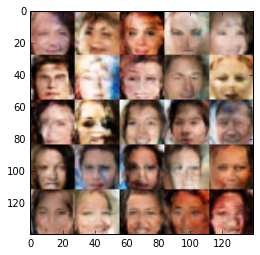

Epoch 1/1... Discriminator Loss: 0.3208... Generator Loss: 1.7901
Epoch 1/1... Discriminator Loss: 0.2929... Generator Loss: 1.8599
Epoch 1/1... Discriminator Loss: 0.3037... Generator Loss: 2.4145
Epoch 1/1... Discriminator Loss: 0.7391... Generator Loss: 3.8451
Epoch 1/1... Discriminator Loss: 0.2214... Generator Loss: 2.5234
Epoch 1/1... Discriminator Loss: 0.2274... Generator Loss: 2.0205
Epoch 1/1... Discriminator Loss: 0.2208... Generator Loss: 2.1597
Epoch 1/1... Discriminator Loss: 0.4028... Generator Loss: 1.4275
Epoch 1/1... Discriminator Loss: 0.2514... Generator Loss: 2.2595
Epoch 1/1... Discriminator Loss: 0.4451... Generator Loss: 3.2735


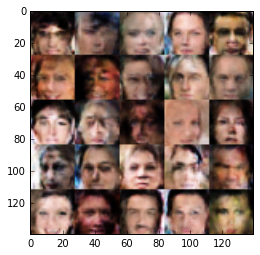

Epoch 1/1... Discriminator Loss: 0.4258... Generator Loss: 2.6715
Epoch 1/1... Discriminator Loss: 0.2574... Generator Loss: 2.7239
Epoch 1/1... Discriminator Loss: 0.2987... Generator Loss: 2.4262
Epoch 1/1... Discriminator Loss: 0.1890... Generator Loss: 2.4278
Epoch 1/1... Discriminator Loss: 0.3585... Generator Loss: 2.6256
Epoch 1/1... Discriminator Loss: 0.2793... Generator Loss: 1.8249
Epoch 1/1... Discriminator Loss: 0.2730... Generator Loss: 3.5056
Epoch 1/1... Discriminator Loss: 0.2254... Generator Loss: 3.3350
Epoch 1/1... Discriminator Loss: 0.3181... Generator Loss: 3.2723
Epoch 1/1... Discriminator Loss: 0.3402... Generator Loss: 1.9330


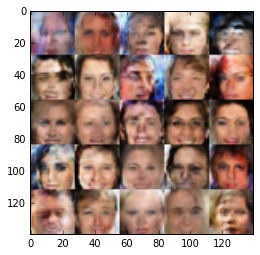

Epoch 1/1... Discriminator Loss: 0.1921... Generator Loss: 2.3990
Epoch 1/1... Discriminator Loss: 0.8137... Generator Loss: 0.6331
Epoch 1/1... Discriminator Loss: 0.2235... Generator Loss: 2.0641
Epoch 1/1... Discriminator Loss: 0.5820... Generator Loss: 3.6271
Epoch 1/1... Discriminator Loss: 0.4155... Generator Loss: 2.0158
Epoch 1/1... Discriminator Loss: 0.4757... Generator Loss: 1.3698
Epoch 1/1... Discriminator Loss: 0.1657... Generator Loss: 2.6262
Epoch 1/1... Discriminator Loss: 0.3248... Generator Loss: 2.0216
Epoch 1/1... Discriminator Loss: 0.3772... Generator Loss: 1.7893
Epoch 1/1... Discriminator Loss: 0.3099... Generator Loss: 3.1018


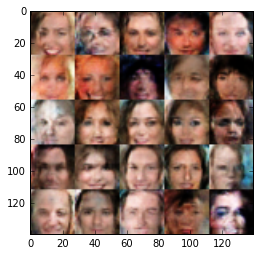

Epoch 1/1... Discriminator Loss: 0.3205... Generator Loss: 2.1437
Epoch 1/1... Discriminator Loss: 0.2969... Generator Loss: 2.9175
Epoch 1/1... Discriminator Loss: 0.4048... Generator Loss: 3.1841
Epoch 1/1... Discriminator Loss: 0.3536... Generator Loss: 1.9136
Epoch 1/1... Discriminator Loss: 0.2153... Generator Loss: 2.3639
Epoch 1/1... Discriminator Loss: 0.2436... Generator Loss: 2.1398
Epoch 1/1... Discriminator Loss: 0.3246... Generator Loss: 2.0011
Epoch 1/1... Discriminator Loss: 0.4125... Generator Loss: 1.7444
Epoch 1/1... Discriminator Loss: 0.4809... Generator Loss: 3.0089
Epoch 1/1... Discriminator Loss: 0.2601... Generator Loss: 2.4904


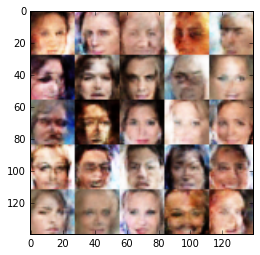

Epoch 1/1... Discriminator Loss: 0.4359... Generator Loss: 1.3505
Epoch 1/1... Discriminator Loss: 0.2549... Generator Loss: 2.0737
Epoch 1/1... Discriminator Loss: 0.7184... Generator Loss: 0.9709
Epoch 1/1... Discriminator Loss: 0.3332... Generator Loss: 1.7238
Epoch 1/1... Discriminator Loss: 0.2422... Generator Loss: 2.2836
Epoch 1/1... Discriminator Loss: 0.3696... Generator Loss: 2.9337
Epoch 1/1... Discriminator Loss: 0.4092... Generator Loss: 1.3539
Epoch 1/1... Discriminator Loss: 0.9147... Generator Loss: 4.4201
Epoch 1/1... Discriminator Loss: 0.2655... Generator Loss: 1.5688
Epoch 1/1... Discriminator Loss: 0.2472... Generator Loss: 2.0423


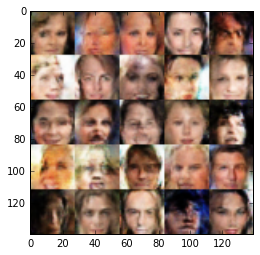

Epoch 1/1... Discriminator Loss: 0.4019... Generator Loss: 1.5516
Epoch 1/1... Discriminator Loss: 0.7430... Generator Loss: 0.8659
Epoch 1/1... Discriminator Loss: 0.3330... Generator Loss: 1.8325
Epoch 1/1... Discriminator Loss: 0.3029... Generator Loss: 2.7195
Epoch 1/1... Discriminator Loss: 0.4401... Generator Loss: 1.4173
Epoch 1/1... Discriminator Loss: 0.3292... Generator Loss: 2.1126
Epoch 1/1... Discriminator Loss: 0.2307... Generator Loss: 3.0119
Epoch 1/1... Discriminator Loss: 0.2053... Generator Loss: 2.8835
Epoch 1/1... Discriminator Loss: 0.1852... Generator Loss: 2.4099
Epoch 1/1... Discriminator Loss: 0.2380... Generator Loss: 2.2577


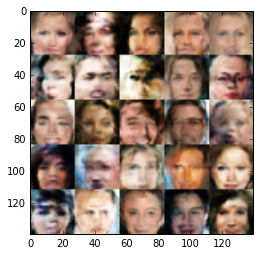

Epoch 1/1... Discriminator Loss: 0.4316... Generator Loss: 1.5817
Epoch 1/1... Discriminator Loss: 0.3470... Generator Loss: 2.3029
Epoch 1/1... Discriminator Loss: 0.3164... Generator Loss: 2.7241
Epoch 1/1... Discriminator Loss: 0.2124... Generator Loss: 2.1256
Epoch 1/1... Discriminator Loss: 0.4047... Generator Loss: 1.5473
Epoch 1/1... Discriminator Loss: 0.2304... Generator Loss: 2.4265
Epoch 1/1... Discriminator Loss: 0.2485... Generator Loss: 1.9881
Epoch 1/1... Discriminator Loss: 0.4050... Generator Loss: 2.5011
Epoch 1/1... Discriminator Loss: 0.2725... Generator Loss: 2.6096
Epoch 1/1... Discriminator Loss: 0.3956... Generator Loss: 2.1515


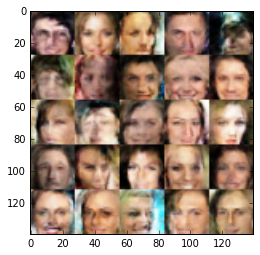

Epoch 1/1... Discriminator Loss: 0.2513... Generator Loss: 2.9179
Epoch 1/1... Discriminator Loss: 0.2968... Generator Loss: 3.8909
Epoch 1/1... Discriminator Loss: 0.2583... Generator Loss: 2.4316
Epoch 1/1... Discriminator Loss: 0.3826... Generator Loss: 1.4426
Epoch 1/1... Discriminator Loss: 0.7638... Generator Loss: 4.3854
Epoch 1/1... Discriminator Loss: 0.3492... Generator Loss: 3.4098
Epoch 1/1... Discriminator Loss: 0.2815... Generator Loss: 2.8336
Epoch 1/1... Discriminator Loss: 0.2786... Generator Loss: 1.4160
Epoch 1/1... Discriminator Loss: 0.3684... Generator Loss: 1.4430
Epoch 1/1... Discriminator Loss: 0.4073... Generator Loss: 1.7883


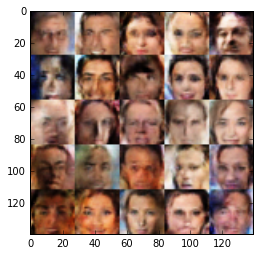

Epoch 1/1... Discriminator Loss: 0.3824... Generator Loss: 1.9286
Epoch 1/1... Discriminator Loss: 0.4364... Generator Loss: 1.2368
Epoch 1/1... Discriminator Loss: 0.2721... Generator Loss: 1.6686
Epoch 1/1... Discriminator Loss: 0.9522... Generator Loss: 4.5652
Epoch 1/1... Discriminator Loss: 0.2247... Generator Loss: 2.5914
Epoch 1/1... Discriminator Loss: 0.2373... Generator Loss: 2.4837
Epoch 1/1... Discriminator Loss: 0.3315... Generator Loss: 1.7505
Epoch 1/1... Discriminator Loss: 0.1810... Generator Loss: 2.4090
Epoch 1/1... Discriminator Loss: 0.6299... Generator Loss: 1.2326
Epoch 1/1... Discriminator Loss: 0.3539... Generator Loss: 1.5874


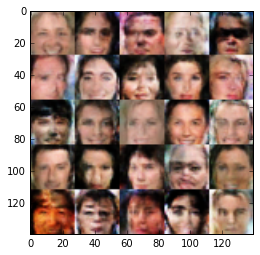

Epoch 1/1... Discriminator Loss: 0.2420... Generator Loss: 2.3722
Epoch 1/1... Discriminator Loss: 0.5565... Generator Loss: 4.2359
Epoch 1/1... Discriminator Loss: 0.4067... Generator Loss: 2.2434
Epoch 1/1... Discriminator Loss: 0.4698... Generator Loss: 3.1487
Epoch 1/1... Discriminator Loss: 0.3860... Generator Loss: 1.6498
Epoch 1/1... Discriminator Loss: 0.5432... Generator Loss: 1.4399
Epoch 1/1... Discriminator Loss: 0.2440... Generator Loss: 2.9462
Epoch 1/1... Discriminator Loss: 0.9127... Generator Loss: 0.6948


In [ ]:
batch_size = 32
z_dim = 100
learning_rate = 0.0001
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.